In [97]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics.pairwise import pairwise_distances
import skbio
from matplotlib.backends.backend_pdf import PdfPages 
from matplotlib import pylab
import os
from collections import OrderedDict
import scipy as sp

In [30]:
def unique(seq, idfun=None): 
   # order preserving
    if idfun is None:
        def idfun(x): return x
    seen = {}
    result = []
    for item in seq:
        if item != np.nan:
            marker = idfun(item)
            if marker in seen: continue
            seen[marker] = 1
            result.append(item)
    return result

In [31]:
otu = pd.read_csv("all_filtered_otu_table.csv", index_col=0).transpose()
metadata= pd.read_csv("sample_metadata.csv", index_col=0)

In [32]:
seq_freq_abundance = pd.read_csv("all_filtered_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])


In [33]:
seq_freq = pd.read_csv("all_filtered_otu_table_counts.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])

In [34]:
# for every patient, filter out seq vars with only one count (important for analysis of # seq vars in each patient)
seq_freq_filtered_by_patient = seq_freq.copy()
seq_freq_filtered_by_patient=seq_freq_filtered_by_patient.replace(1,0)

In [35]:
genus_abundance = pd.read_csv("abundances_by_tax_level_relfreq/Genus_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])
genus = pd.read_csv("abundances_by_tax_level_counts/Genus_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])

In [36]:
genus_filtered_by_patient = genus.copy()
genus_filtered_by_patient=genus_filtered_by_patient.replace(1,0)

In [37]:
family_abundance = pd.read_csv("abundances_by_tax_level_relfreq/Family_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])
family = pd.read_csv("abundances_by_tax_level_counts/Family_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])

In [38]:
 set(seq_freq_abundance.columns) - set(seq_freq.columns) 

set()

### Donor alpha diversity 

In [39]:
aerobic_donor_direct = ["ndc411", "ndc412", "ndc413", "ndc414"]
aerobic_donor_pma = ["ndc472", "ndc473", "ndc474", "ndc475"]
anaerobic_donor_direct = ["ndc407", "ndc408", "ndc409", "ndc410"]
anaerobic_donor_pma = ["ndc468", "ndc469", "ndc470", "ndc471"]

In [40]:
#get alpha diversities of each donor sample, sorted by processing and sequencing method
add = []
adp = []
andd = []
andp = []
for i in aerobic_donor_direct:
    add.append(skbio.diversity.alpha_diversity("shannon", seq_freq.loc[i]).values[0])
for i in anaerobic_donor_direct:
    andd.append(skbio.diversity.alpha_diversity("shannon", seq_freq.loc[i]).values[0])
for i in aerobic_donor_pma:
    adp.append(skbio.diversity.alpha_diversity("shannon", seq_freq.loc[i]).values[0])   
for i in anaerobic_donor_pma:
    andp.append(skbio.diversity.alpha_diversity("shannon", seq_freq.loc[i]).values[0])    



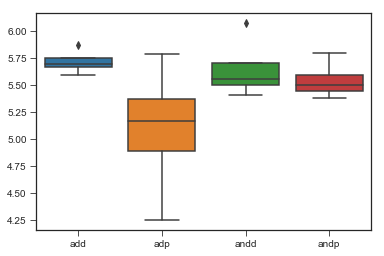

In [41]:
sns.boxplot(data=[add,adp,andd,andp])
plt.xticks(plt.xticks()[0], ["add","adp","andd","andp"])
plt.show()

### Donor diversity by sequence variant count

In [42]:
add = []
adp = []
andd = []
andp = []
for i in aerobic_donor_direct:
    add.append((seq_freq.loc[i] != 0).sum())
for i in anaerobic_donor_direct:
    andd.append((seq_freq.loc[i] != 0).sum())
for i in aerobic_donor_pma:
    adp.append((seq_freq.loc[i] != 0).sum())   
for i in anaerobic_donor_pma:
    andp.append((seq_freq.loc[i] != 0).sum())    




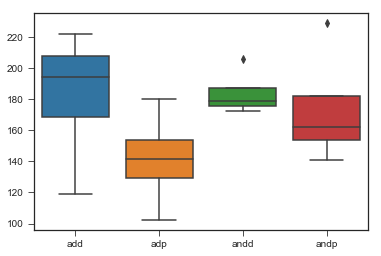

In [43]:
sns.boxplot(data=[add,adp,andd,andp])
plt.xticks(plt.xticks()[0], ["add","adp","andd","andp"])
plt.show()

### Time series

In [44]:
metadata.head()

,pma,speedvac,donor_v_patient,anaerobic_proc,patient_sex,patient_age,donor_fmt_num,anaerobic_fmt,timepoint,donor_num,person_id,patient_num,direct_donor_fmt_id,pma_donor_fmt_id,fmt_sample
ndc415,NaN,yes,patient,NaN,male,88.0,131.0,Anaerobic,Pre-FMT,NaN,140,140.0,ndc408,ndc469,0131-0081-36
ndc421,NaN,yes,patient,NaN,male,88.0,131.0,Anaerobic,4 weeks,NaN,140,140.0,ndc408,ndc469,0131-0081-36
ndc422,NaN,no,patient,NaN,male,88.0,131.0,Anaerobic,10 days,NaN,140,140.0,ndc408,ndc469,0131-0081-36
ndc423,NaN,no,patient,NaN,male,88.0,131.0,Anaerobic,3 days,NaN,140,140.0,ndc408,ndc469,0131-0081-36
ndc428,NaN,no,patient,NaN,male,88.0,131.0,Anaerobic,8 weeks,NaN,140,140.0,ndc408,ndc469,0131-0081-36


In [45]:
seq_freq_extra = pd.read_csv("all_filtered_otu_table_counts_extra.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])

In [46]:
seq_var_dict = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
for i in seq_freq.index:
    if metadata.loc[i, "timepoint"] == "Pre-FMT":
        seq_var_dict[metadata.loc[i, "person_id"]] = [list(set(list(seq_freq.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq.loc[i].nonzero()[0]))),list(set(list(seq_freq.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq.loc[i].nonzero()[0])))]

In [47]:
seq_var_dict_extra = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
for i in seq_freq_extra.index:
    if metadata.loc[i, "timepoint"] == "Pre-FMT":
        seq_var_dict_extra[metadata.loc[i, "person_id"]] = [list(set(list(seq_freq_extra.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq_extra.loc[i].nonzero()[0]))),list(set(list(seq_freq_extra.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq_extra.loc[i].nonzero()[0])))]

In [109]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178
donor_dict = {131:"Donor 1", 485:"Donor 2", 500:"Donor 3"}
shannon_summary_df = pd.DataFrame(columns=["donor", "timepoint", "shannon", "aerobic", "patient"])
with PdfPages("shannon_timeseries.pdf") as pp:
    for patient in seq_var_dict.keys():
        shannon_df = pd.DataFrame(columns=["timepoint", "shannon"])
        for i, timepoint in enumerate(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]):
            try:
                #sample_id of sample corresponding to the given patient and timepoint
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                shannon = skbio.diversity.alpha_diversity("shannon", seq_freq.loc[sample_id]).values[0]
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                shannon_df = shannon_df.append({"timepoint":timepoint, "shannon":shannon}, ignore_index=True)
                donor = donor_dict[int(metadata.loc[sample_id, "donor_fmt_num"])]
                shannon_summary_df = shannon_summary_df.append({"donor":donor, "timepoint":timepoint, "shannon":shannon, "aerobic":aerobic, "patient":patient}, ignore_index=True)       
            #missing timepoints
            except Exception as e:
                print(e)            
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([shannon_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([shannon_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([shannon_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="shannon",data = shannon_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("shannon diversity")
        pp.savefig()
        plt.close()

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


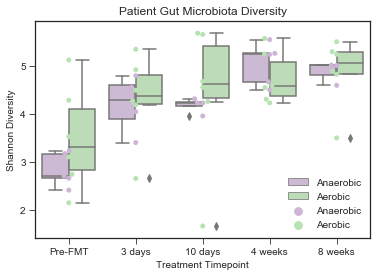

In [106]:
ax = sns.boxplot(x="timepoint", y="shannon", hue="aerobic", data=shannon_summary_df, palette="PRGn")
sns.swarmplot(x="timepoint", y="shannon", hue="aerobic", data=shannon_summary_df, palette="PRGn")
sns.set_style("ticks")
plt.xticks(plt.xticks()[0], ["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])
leg = ax.axes.get_legend()
leg.set_title("")
ax.set_ylabel("Shannon Diversity")
ax.set_xlabel("Treatment Timepoint")
ax.set_title("Patient Gut Microbiota Diversity")
plt.figure(figsize=(20,10))
plt.show()

In [92]:
shannon10days = shannon_summary_df[shannon_summary_df["timepoint"]=="10 days"]

In [96]:
shannon10daysanaerobic = np.array(shannon10days[shannon10days["aerobic"]=="Anaerobic"].shannon)
shannon10daysaerobic = np.array(shannon10days[shannon10days["aerobic"]=="Aerobic"].shannon)

In [98]:
sp.stats.mannwhitneyu(shannon10daysanaerobic, shannon10daysaerobic)

MannwhitneyuResult(statistic=5.0, pvalue=0.08290328009700676)

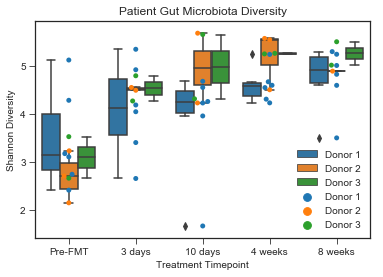

In [112]:
ax = sns.boxplot(x="timepoint", y="shannon", hue="donor", data=shannon_summary_df, )
sns.swarmplot(x="timepoint", y="shannon", hue="donor", data=shannon_summary_df,)
sns.set_style("ticks")
plt.xticks(plt.xticks()[0], ["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])
leg = ax.axes.get_legend()
leg.set_title("")
leg.set
ax.set_ylabel("Shannon Diversity")
ax.set_xlabel("Treatment Timepoint")
ax.set_title("Patient Gut Microbiota Diversity")
plt.figure(figsize=(20,10))
plt.show()

#### Fold Change

In [50]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

shannon_delta_summary_df = pd.DataFrame(columns=["timepoint", "shannon","shannon_delta", "aerobic"])
with PdfPages("shannon_delta_timeseries.pdf") as pp:
    for patient in seq_var_dict.keys():
        shannon_delta_df = pd.DataFrame(columns=["timepoint", "shannon","shannon_delta"])
        for i, timepoint in enumerate(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]):
            try:
                #sample_id of sample corresponding to the given patient and timepoint
              
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                
                shannon = skbio.diversity.alpha_diversity("shannon", seq_freq.loc[sample_id]).values[0]
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                if timepoint != "Pre-FMT":
                    
                    delta = float(shannon/baseline)
                    shannon_delta_df = shannon_delta_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":delta}, ignore_index=True)
                    shannon_delta_summary_df = shannon_delta_summary_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":delta, "aerobic":aerobic}, ignore_index=True)       
                else:
                    shannon_delta_df = shannon_delta_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":0.0}, ignore_index=True)
                    shannon_delta_summary_df = shannon_delta_summary_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":0.0, "aerobic":aerobic}, ignore_index=True)       
                    baseline = shannon

            #missing timepoints
            except Exception as e:
                print(e)            
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="shannon_delta",data = shannon_delta_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("shannon fold change")
        pp.savefig()
        plt.close()

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


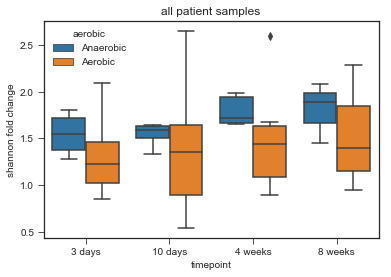

In [51]:
ax = sns.boxplot(x="timepoint", y="shannon_delta", hue="aerobic", data=shannon_delta_summary_df[shannon_delta_summary_df["timepoint"]!= "Pre-FMT"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("shannon fold change")
ax.set_title("all patient samples")
plt.show()

In [52]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

shannon_delta_summary_df_extra = pd.DataFrame(columns=["timepoint", "shannon","shannon_delta", "aerobic"])
with PdfPages("shannon_delta_timeseries.pdf") as pp:
    for patient in seq_var_dict_extra.keys():
        shannon_delta_df = pd.DataFrame(columns=["timepoint", "shannon","shannon_delta"])
        for i, timepoint in enumerate(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]):
            try:
                #sample_id of sample corresponding to the given patient and timepoint
                
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                
                shannon = skbio.diversity.alpha_diversity("shannon", seq_freq_extra.loc[sample_id]).values[0]
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                if timepoint != "Pre-FMT":
                    
                    delta = float(shannon/baseline)
                    shannon_delta_df = shannon_delta_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":delta}, ignore_index=True)
                    shannon_delta_summary_df_extra = shannon_delta_summary_df_extra.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":delta, "aerobic":aerobic}, ignore_index=True)       
                else:
                    
                    shannon_delta_df = shannon_delta_df.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":0.0}, ignore_index=True)
                    shannon_delta_summary_df_extra = shannon_delta_summary_df_extra.append({"timepoint":timepoint, "shannon":shannon,"shannon_delta":0.0, "aerobic":aerobic}, ignore_index=True)       
                    baseline = shannon

            #missing timepoints
            except Exception as e:
                print(e)            
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([shannon_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="shannon_delta",data = shannon_delta_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("shannon fold change")
        pp.savefig()
        plt.close()

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


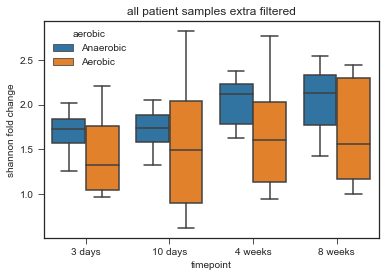

In [53]:
ax = sns.boxplot(x="timepoint", y="shannon_delta", hue="aerobic", data=shannon_delta_summary_df_extra[shannon_delta_summary_df_extra["timepoint"]!= "Pre-FMT"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("shannon fold change")
ax.set_title("all patient samples extra filtered")
plt.show()

#### By Seq Var Count

In [54]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

seq_var_count_delta_summary_df = pd.DataFrame(columns=["timepoint", "seq_var_count","seq_var_count_delta", "aerobic"])
with PdfPages("seq_var_count_delta_timeseries.pdf") as pp:
    for patient in seq_var_dict.keys():
        seq_var_count_delta_df = pd.DataFrame(columns=["timepoint", "seq_var_count","seq_var_count_delta"])
        for i, timepoint in enumerate(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]):
            try:
                #sample_id of sample corresponding to the given patient and timepoint
                
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                
                seq_var_count = len(seq_freq_filtered_by_patient.loc[sample_id].nonzero()[0])
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                if timepoint != "Pre-FMT":
                    
                    delta = float(seq_var_count/baseline)
                    seq_var_count_delta_df = seq_var_count_delta_df.append({"timepoint":timepoint, "seq_var_count":seq_var_count,"seq_var_count_delta":delta}, ignore_index=True)
                    seq_var_count_delta_summary_df = seq_var_count_delta_summary_df.append({"timepoint":timepoint, "seq_var_count":seq_var_count,"seq_var_count_delta":delta, "aerobic":aerobic}, ignore_index=True)       
                else:
                    
                    seq_var_count_delta_df = seq_var_count_delta_df.append({"timepoint":timepoint, "seq_var_count":seq_var_count,"seq_var_count_delta":0.0}, ignore_index=True)
                    seq_var_count_delta_summary_df = seq_var_count_delta_summary_df.append({"timepoint":timepoint, "seq_var_count":seq_var_count,"seq_var_count_delta":0.0, "aerobic":aerobic}, ignore_index=True)       
                    baseline = seq_var_count

            #missing timepoints
            except Exception as e:
                print(e)            
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([seq_var_count_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([seq_var_count_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([seq_var_count_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="seq_var_count_delta",data = seq_var_count_delta_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("seq_var_count fold change")
        pp.savefig()
        plt.close()

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


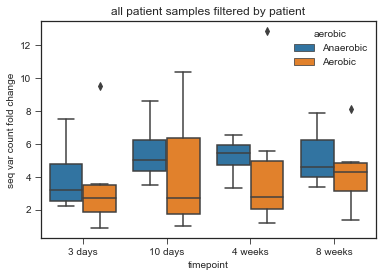

In [55]:
ax = sns.boxplot(x="timepoint", y="seq_var_count_delta", hue="aerobic", data=seq_var_count_delta_summary_df[seq_var_count_delta_summary_df["timepoint"]!= "Pre-FMT"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("seq var count fold change")
ax.set_title("all patient samples filtered by patient")
plt.show()

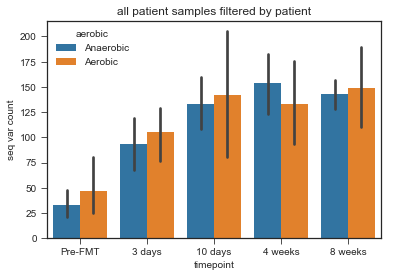

In [56]:
ax = sns.barplot(x="timepoint", y="seq_var_count", hue="aerobic", data=seq_var_count_delta_summary_df)
plt.xticks(plt.xticks()[0], ["Pre-FMT", "3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("seq var count")
ax.set_title("all patient samples filtered by patient")
plt.show()

#### By Genus Count

In [57]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

genus_delta_summary_df = pd.DataFrame(columns=["timepoint", "genus","genus_delta", "aerobic"])
with PdfPages("genus_delta_timeseries.pdf") as pp:
    for patient in seq_var_dict.keys():
        genus_delta_df = pd.DataFrame(columns=["timepoint", "genus","genus_delta"])
        for i, timepoint in enumerate(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]):
            try:
                #sample_id of sample corresponding to the given patient and timepoint
                
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                
                genus = len(genus_filtered_by_patient.loc[sample_id].nonzero()[0])
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                if timepoint != "Pre-FMT":
                    
                    delta = float(genus/baseline)
                    genus_delta_df = genus_delta_df.append({"timepoint":timepoint, "genus":genus,"genus_delta":delta}, ignore_index=True)
                    genus_delta_summary_df = genus_delta_summary_df.append({"timepoint":timepoint, "genus":genus,"genus_delta":delta, "aerobic":aerobic}, ignore_index=True)       
                else:
                    
                    genus_delta_df = genus_delta_df.append({"timepoint":timepoint, "genus":genus,"genus_delta":0.0}, ignore_index=True)
                    genus_delta_summary_df = genus_delta_summary_df.append({"timepoint":timepoint, "genus":genus,"genus_delta":0.0, "aerobic":aerobic}, ignore_index=True)       
                    baseline = genus

            #missing timepoints
            except Exception as e:
                print(e)            
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([genus_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([genus_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([genus_delta_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="genus_delta",data = genus_delta_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("genus fold change")
        pp.savefig()
        plt.close()

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


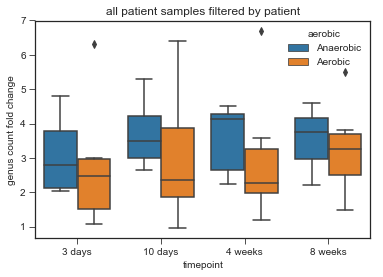

In [58]:
ax = sns.boxplot(x="timepoint", y="genus_delta", hue="aerobic", data=genus_delta_summary_df[genus_delta_summary_df["timepoint"]!= "Pre-FMT"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("genus count fold change")
ax.set_title("all patient samples filtered by patient")
plt.show()

### Engraftment

In [59]:
seq_var_dict = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
for i in seq_freq.index:
    if metadata.loc[i, "timepoint"] == "Pre-FMT":
        seq_var_dict[metadata.loc[i, "person_id"]] = [list(set(list(seq_freq.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq.loc[i].nonzero()[0]))),list(set(list(seq_freq.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(seq_freq.loc[i].nonzero()[0])))]

In [60]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

engraftment_summary_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance", "aerobic"])
with PdfPages("engraftment_timeseries.pdf") as pp:
    for patient, donor_seqs in seq_var_dict.items():
        donor_seqs.append(set(donor_seqs[0])-set(donor_seqs[1]))
        engraftment_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance"])
        for i, timepoint in enumerate(["3 days", "10 days", "4 weeks", "8 weeks"]):  
            try:

                #sample_id of sample corresponding to the given patient and timepoint
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                #list of indices of seq vars from direct and pma-processed donor samples that also show up in patient at different timepoints

#                 direct = list(set(donor_seqs[0]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
#                 pma = list(set(donor_seqs[1]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
#                 direct_pma = list(set(donor_seqs[2]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
                
                direct = list(set(donor_seqs[0]) & set(seq_freq.loc[sample_id]))
                pma = list(set(donor_seqs[1]) & set(seq_freq.loc[sample_id]))
                direct_pma = list(set(donor_seqs[2]) & set(seq_freq.loc[sample_id]))
 
                direct_abundance = 0
                pma_abundance = 0
                direct_pma_abundance = 0
                
                for d in direct:
                    direct_abundance += seq_freq_abundance.loc[sample_id,seq_freq_abundance.columns[d]]
                for p in pma:
                    pma_abundance += seq_freq_abundance.loc[sample_id,seq_freq.columns[p]]    
                for dp in direct_pma:
                    direct_pma_abundance += seq_freq_abundance.loc[sample_id,seq_freq.columns[dp]]  
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(seq_freq.loc[sample_id]), "abundance":direct_abundance}, ignore_index=True)
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(seq_freq.loc[sample_id]), "abundance":pma_abundance}, ignore_index=True)
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct-pma", "count":len(direct_pma), "freq":len(direct_pma)/len(seq_freq.loc[sample_id]), "abundance":direct_pma_abundance}, ignore_index=True)
                engraftment_summary_df = engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(seq_freq.loc[sample_id]), "abundance":direct_abundance, "aerobic":aerobic}, ignore_index=True)
                engraftment_summary_df = engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(seq_freq.loc[sample_id]), "abundance":pma_abundance,"aerobic":aerobic}, ignore_index=True)
                

            #missing timepoints
            except Exception as e:
                print(e)
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = engraftment_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("total # donor seq vars in patient")
        pp.savefig()
        plt.close()
        
        ax2 = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = engraftment_df)
        ax2.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax2.set_ylabel("total relative abundance of donor seq vars in patient")
        pp.savefig()
        plt.close()



index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


In [61]:
fig, ax = plt.subplots()
with PdfPages("engraftment_timeseries_donorordered.pdf") as pp:
    for a in donor1:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = a[0])
        ax.set_title("Patient: {} Donor: {} {}".format(a[1], 500, a[2]))
        ax.set_ylabel("total # donor seq vars in patient")
        pp.savefig()
        plt.close()
    for b in donor2:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = b[0])
        ax.set_title("Patient: {} Donor: {} {}".format(b[1], 485, b[2]))
        ax.set_ylabel("total # donor seq vars in patient")
        pp.savefig()
        plt.close()
    for c in donor3:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = c[0])
        ax.set_title("Patient: {} Donor: {} {}".format(c[1], 131, c[2]))
        ax.set_ylabel("total # donor seq vars in patient")
        pp.savefig()
        plt.close()
    for a in donor1:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = a[0])
        ax.set_title("Patient: {} Donor: {} {}".format(a[1], 500, a[2]))
        ax.set_ylabel("total relative abundance of donor seq vars in patient")
        pp.savefig()
        plt.close()
    for b in donor2:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = b[0])
        ax.set_title("Patient: {} Donor: {} {}".format(b[1], 485, b[2]))
        ax.set_ylabel("total relative abundance of donor seq vars in patient")
        pp.savefig()
        plt.close()
    for c in donor3:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = c[0])
        ax.set_title("Patient: {} Donor: {} {}".format(c[1], 131, c[2]))
        ax.set_ylabel("total relative abundance of donor seq vars in patient")
        pp.savefig()
        plt.close()

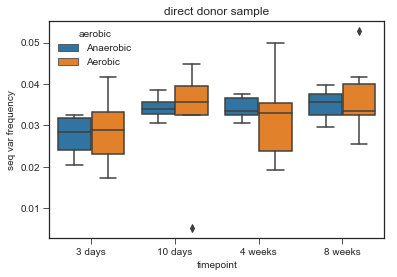

In [62]:
ax = sns.boxplot(x="timepoint", y="freq", hue="aerobic", data=engraftment_summary_df[engraftment_summary_df['direct/pma']=="direct"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("seq var frequency")
ax.set_title("direct donor sample")
plt.show()

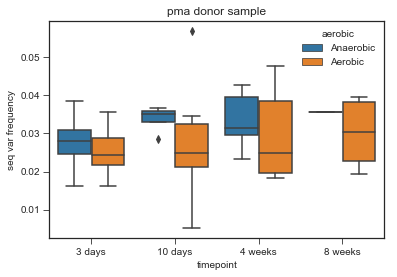

In [63]:
ax = sns.boxplot(x="timepoint", y="freq", hue="aerobic", data=engraftment_summary_df[engraftment_summary_df['direct/pma']=="pma"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("seq var frequency")
ax.set_title("pma donor sample")
plt.show()

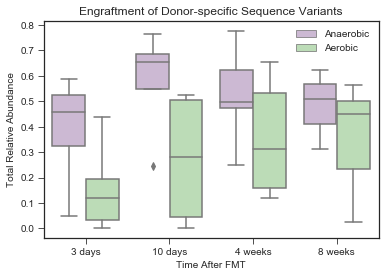

In [64]:
ax = sns.boxplot(x="timepoint", y="abundance", hue="aerobic", palette="PRGn",data=engraftment_summary_df[engraftment_summary_df['direct/pma']=="direct"])
leg = ax.axes.get_legend()
leg.set_title("")
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("Total Relative Abundance")
ax.set_xlabel("Time After FMT")
ax.set_title("Engraftment of Donor-specific Sequence Variants")
plt.show()

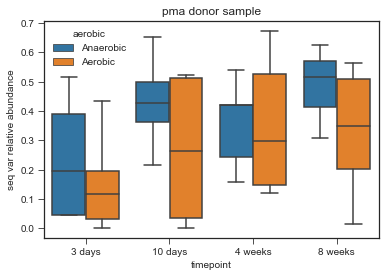

In [65]:
ax = sns.boxplot(x="timepoint", y="abundance", hue="aerobic", data=engraftment_summary_df[engraftment_summary_df['direct/pma']=="pma"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("seq var relative abundance")
ax.set_title("pma donor sample")
plt.show()

### Engraftment, collapsed to genus level

In [67]:
genus_abundance = pd.read_csv("abundances_by_tax_level_relfreq/Genus_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])
genus = pd.read_csv("abundances_by_tax_level_counts/Genus_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"])
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

spores = []
genus_dict = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
for i in genus.index:
    if metadata.loc[i, "timepoint"] == "Pre-FMT":
        genus_dict[metadata.loc[i, "person_id"]] = [list(set(list(genus.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(genus.loc[i].nonzero()[0]))),list(set(list(genus.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(genus.loc[i].nonzero()[0])))]
genus_engraftment_summary_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance", "aerobic"])
with PdfPages("engraftment_timeseries_genus.pdf") as pp:
    for patient, donor_seqs in genus_dict.items():
        donor_seqs.append(set(donor_seqs[0])-set(donor_seqs[1]))
        genus_engraftment_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance"])
        for i, timepoint in enumerate(["3 days", "10 days", "4 weeks", "8 weeks"]):  
            try:
                #sample_id of sample corresponding to the given patient and timepoint
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                #list of indices of seq vars from direct and pma-processed donor samples that also show up in patient at different timepoints

                direct = list(set(donor_seqs[0]) & set(genus_filtered_by_patient.loc[sample_id]))
                pma = list(set(donor_seqs[1]) & set(genus_filtered_by_patient.loc[sample_id]))
                direct_pma = list(set(donor_seqs[2]) & set(genus_filtered_by_patient.loc[sample_id]))
                [spores.append(genus.columns[spore]) for spore in direct_pma]
                direct_abundance = 0
                pma_abundance = 0
                direct_pma_abundance = 0
                for d in direct:
                    direct_abundance += genus_abundance.loc[sample_id,genus_abundance.columns[d]]
                for p in pma:
                    pma_abundance += genus_abundance.loc[sample_id,genus_abundance.columns[p]]    
                for dp in direct_pma:
                    direct_pma_abundance += genus_abundance.loc[sample_id,genus_abundance.columns[dp]]   
                
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                
                genus_engraftment_df = genus_engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(genus.loc[sample_id]), "abundance":direct_abundance}, ignore_index=True)
                genus_engraftment_df = genus_engraftment_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(genus.loc[sample_id]), "abundance":pma_abundance}, ignore_index=True)
                genus_engraftment_df = genus_engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct-pma", "count":len(direct_pma), "freq":len(direct_pma)/len(genus.loc[sample_id]), "abundance":direct_pma_abundance}, ignore_index=True)
                genus_engraftment_summary_df = genus_engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(genus.loc[sample_id]), "abundance":direct_abundance, "aerobic":aerobic}, ignore_index=True)
                genus_engraftment_summary_df = genus_engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(genus.loc[sample_id]), "abundance":pma_abundance, "aerobic":aerobic}, ignore_index=True)

            #missing timepoints
            except Exception as e:
                print(e)
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([genus_engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([genus_engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([genus_engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = genus_engraftment_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("total # donor genera in patient")
        pp.savefig()
        plt.close()
        
        ax2 = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = genus_engraftment_df)
        ax2.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax2.set_ylabel("total relative abundance of donor genera in patient")
        pp.savefig()
        plt.close()




index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


In [68]:
unique(spores)

['Defluviitaleaceae_UCG-011',
 'Holdemania',
 'Paeniclostridium',
 'Senegalimassilia',
 'Family_XIII_UCG-002',
 'Tyzzerella',
 'Ruminococcaceae_UCG-009',
 'Acetanaerobacterium',
 'Oscillospira',
 'Leuconostoc',
 'Lachnospiraceae_AC2044_group',
 'Fusicatenibacter',
 'Lachnospiraceae_UCG-006',
 'Anaerotruncus',
 'Oxalobacter',
 'Sutterella',
 'Flavonifractor',
 'Bilophila',
 'Actinomyces',
 'Marvinbryantia',
 'Lachnospiraceae_FCS020_group',
 'Anaerofilum',
 'Candidatus_Soleaferrea',
 'Oscillibacter',
 'Erysipelatoclostridium',
 'Dialister',
 'Akkermansia',
 'Sarcina']

In [69]:
fig, ax = plt.subplots()
with PdfPages("engraftment_timeseries_donorordered_genus.pdf") as pp:
    for a in donor1:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = a[0])
        ax.set_title("Patient: {} Donor: {} {}".format(a[1], 500, a[2]))
        ax.set_ylabel("total # donor genera in patient")
        pp.savefig()
        plt.close()
    for b in donor2:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = b[0])
        ax.set_title("Patient: {} Donor: {} {}".format(b[1], 485, b[2]))
        ax.set_ylabel("total # donor genera in patient")
        pp.savefig()
        plt.close()
    for c in donor3:
        ax = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = c[0])
        ax.set_title("Patient: {} Donor: {} {}".format(c[1], 131, c[2]))
        ax.set_ylabel("total # donor genera in patient")
        pp.savefig()
        plt.close()
    for a in donor1:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = a[0])
        ax.set_title("Patient: {} Donor: {} {}".format(a[1], 500, a[2]))
        ax.set_ylabel("total relative abundance of donor genera in patient")
        pp.savefig()
        plt.close()
    for b in donor2:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = b[0])
        ax.set_title("Patient: {} Donor: {} {}".format(b[1], 485, b[2]))
        ax.set_ylabel("total relative abundance of donor genera in patient")
        pp.savefig()
        plt.close()
    for c in donor3:
        ax = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = c[0])
        ax.set_title("Patient: {} Donor: {} {}".format(c[1], 131, c[2]))
        ax.set_ylabel("total relative abundance of donor genera in patient")
        pp.savefig()
        plt.close()

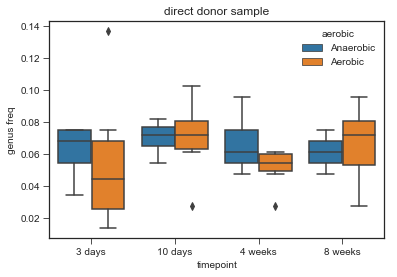

In [70]:
ax = sns.boxplot(x="timepoint", y="freq", hue="aerobic", data=genus_engraftment_summary_df[genus_engraftment_summary_df['direct/pma']=="direct"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("genus freq")
ax.set_title("direct donor sample")
plt.show()

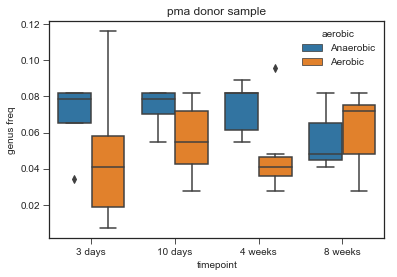

In [71]:
ax = sns.boxplot(x="timepoint", y="freq", hue="aerobic", data=genus_engraftment_summary_df[genus_engraftment_summary_df['direct/pma']=="pma"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("genus freq")
ax.set_title("pma donor sample")
plt.show()

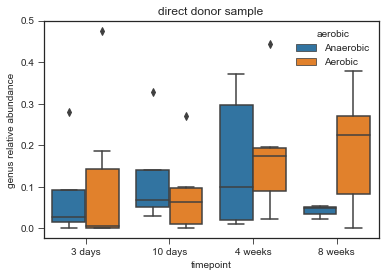

In [72]:
ax = sns.boxplot(x="timepoint", y="abundance", hue="aerobic", data=genus_engraftment_summary_df[genus_engraftment_summary_df['direct/pma']=="direct"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("genus relative abundance")
ax.set_title("direct donor sample")
plt.show()

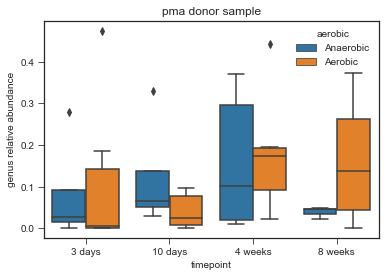

In [73]:
ax = sns.boxplot(x="timepoint", y="abundance", hue="aerobic", data=genus_engraftment_summary_df[genus_engraftment_summary_df['direct/pma']=="pma"])
plt.xticks(plt.xticks()[0], ["3 days", "10 days", "4 weeks", "8 weeks"])
ax.set_ylabel("genus relative abundance")
ax.set_title("pma donor sample")
plt.show()

### Patient Taxonomic Compositions

In [74]:
def taxa_composition(otu_table, metadata, pdf):
    with PdfPages(pdf) as pp:
        for timepoint in ["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"]:
            patients = metadata.index[metadata["timepoint"]==timepoint]
            otu_copy = otu_table.copy()
            otu_copy = otu_copy.transpose().drop(["ndc432", "ndc442"]).loc[patients]
            otu_copy["aerobic"] = metadata["anaerobic_fmt"]
            otu_copy.index = otu_copy.index.map(mapper=(lambda x: int(metadata.loc[x, "patient_num"])))            
            otu_copy_sorted = otu_copy.sort_values(by="aerobic")
            otu_copy_sorted.plot(kind="bar", stacked=True, colormap="tab20")
            pylab.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol=5)
            pp.savefig()
            


In [81]:
dfs = [pd.read_csv("abundances_by_tax_level_relfreq/{}".format(f), index_col=0) for f in os.listdir("abundances_by_tax_level_relfreq")[1:]]

In [82]:
for df in dfs:
    taxa_composition(df, metadata, "composition_by_taxa/{}.pdf".format(df.index.name))

/Users/vivzhong/anaconda/envs/intro_dl/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [83]:
patients_0 = metadata.index[metadata["timepoint"]=="Pre-FMT"]

In [84]:
taxa_comp_phylum = pd.read_csv("abundances_by_tax_level_relfreq/Phylum_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"]).loc[patients_0]
taxa_comp_phylum["aerobic"] = metadata["anaerobic_fmt"]
taxa_comp_phylum_sorted = taxa_comp_phylum.sort_values(by="aerobic")
taxa_comp_phylum_sorted.index = taxa_comp_phylum_sorted.index.map(mapper=(lambda x: int(metadata.loc[x,"patient_num"])))

In [86]:
taxa_comp_family = pd.read_csv("abundances_by_tax_level_relfreq//Family_otu_table.csv", index_col=0).transpose().drop(["ndc432", "ndc442"]).loc[patients_0]
taxa_comp_family["aerobic"] = metadata["anaerobic_fmt"]
taxa_comp_family_sorted = taxa_comp_family.sort_values(by="aerobic")
taxa_comp_family_sorted.index = taxa_comp_family_sorted.index.map(mapper=(lambda x: int(metadata.loc[x,"patient_num"])))

In [87]:
taxa_comp_genus = genus_abundance.loc[patients_0]
taxa_comp_genus["aerobic"] = metadata["anaerobic_fmt"]
taxa_comp_genus_sorted = taxa_comp_genus.sort_values(by="aerobic")

In [88]:
taxa_comp_phylum_sorted.head()

Phylum,Actinobacteria,Bacteroidetes,Cyanobacteria,Euryarchaeota,Firmicutes,Fusobacteria,Lentisphaerae,Proteobacteria,Synergistetes,Tenericutes,Verrucomicrobia,aerobic
146,0.000000,0.000000,0.0,0.0,0.573734,0.000000,0.0,0.021918,0.0,0.0,0.404348,Aerobic
154,0.003104,0.003449,0.0,0.0,0.971547,0.000000,0.0,0.020003,0.0,0.0,0.001897,Aerobic
160,0.000000,0.063663,0.0,0.0,0.270785,0.103833,0.0,0.009026,0.0,0.0,0.552693,Aerobic
163,0.000000,0.093614,0.0,0.0,0.886417,0.001780,0.0,0.018189,0.0,0.0,0.000000,Aerobic
176,0.000152,0.000000,0.0,0.0,0.299388,0.000000,0.0,0.121261,0.0,0.0,0.579199,Aerobic


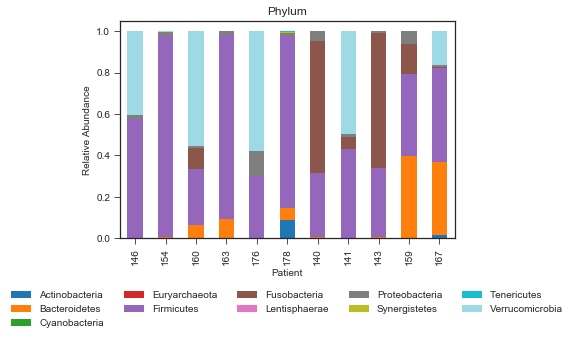

In [90]:
taxa_comp_phylum_sorted.plot(kind="bar", stacked=True, colormap="tab20")
pylab.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol=5)
plt.xlabel("Patient")
plt.ylabel("Relative Abundance")
plt.title("Phylum")
plt.show()

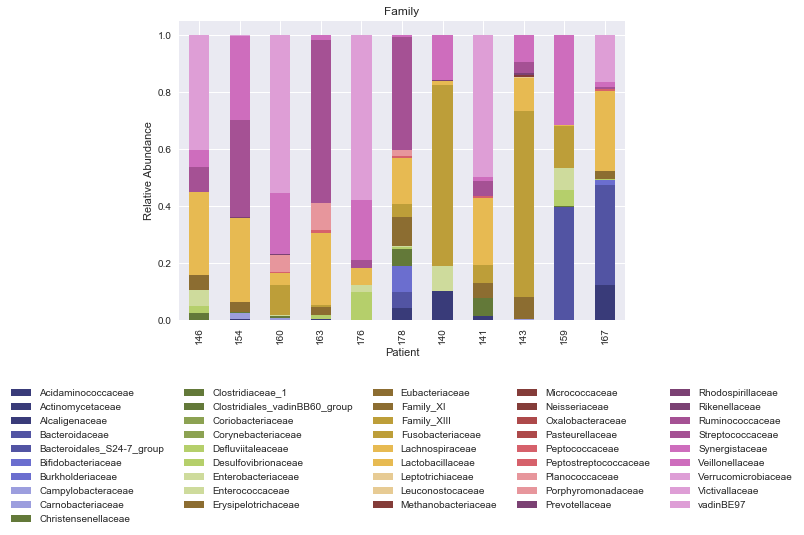

In [197]:
taxa_comp_family_sorted.plot(kind="bar", stacked=True, colormap="tab20b")
pylab.legend(loc=9, bbox_to_anchor=(0.5, -0.2), ncol=5)
plt.xlabel("Patient")
plt.ylabel("Relative Abundance")
plt.title("Family")
plt.show()

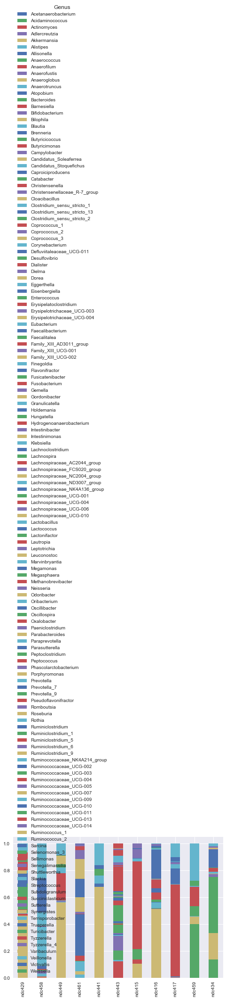

In [198]:
taxa_comp_genus_sorted.plot(kind="bar", stacked=True)
plt.show()

### Specific bugs

How all OTUs engraft

In [210]:
genus_engraftment_all_otus_all_timepoints = engraftment_capability_all_otus_all_timepoints(genus, genus_abundance, metadata)

index 0 is out of bounds for axis 0 with size 0
141.0 10 days
index 0 is out of bounds for axis 0 with size 0
141.0 3 days
index 0 is out of bounds for axis 0 with size 0
141.0 8 weeks
index 0 is out of bounds for axis 0 with size 0
159.0 8 weeks


In [211]:
genus_engraftment_all_otus_all_timepoints["otu_source"].value_counts()

environmental    8200
donor            5690
patient          1120
both             1050
Name: otu_source, dtype: int64

In [212]:
all_genus_engraftment = genus_engraftment_all_otus_all_timepoints
all_genus_engraftment_direct = all_genus_engraftment[all_genus_engraftment["donor_direct"]=="direct"]
all_genus_engraftment_pma = all_genus_engraftment[all_genus_engraftment["donor_direct"]=="pma"]

In [214]:
all_genus_engraftment_pma_131 = all_genus_engraftment_pma[all_genus_engraftment_pma["donor"] == 131]
all_genus_engraftment_pma_131_donor = all_genus_engraftment_pma_131[all_genus_engraftment_pma_131["otu_source"] =="donor"]
all_genus_engraftment_pma_131_notdonor = all_genus_engraftment_pma_131[all_genus_engraftment_pma_131["otu_source"] !="donor"]
donor_131_otus_engrafted = unique(all_genus_engraftment_pma_131_donor["otu"].values) 
all_genus_engraftment_pma_131_donor_only = all_genus_engraftment_pma_131_donor.copy()
for otu in donor_131_otus_engrafted:
    if sum(all_genus_engraftment_pma_131_notdonor[all_genus_engraftment_pma_131_notdonor["otu"] == otu]["count"].values) > 0:
        drop_indices = all_genus_engraftment_pma_131_donor.index[all_genus_engraftment_pma_131_donor["otu"] == otu]
        all_genus_engraftment_pma_131_donor_only = all_genus_engraftment_pma_131_donor_only.drop(drop_indices)
        

In [215]:
all_genus_engraftment_pma_485 = all_genus_engraftment_pma[all_genus_engraftment_pma["donor"] == 485]
all_genus_engraftment_pma_485_donor = all_genus_engraftment_pma_485[all_genus_engraftment_pma_485["otu_source"] =="donor"]
all_genus_engraftment_pma_485_notdonor = all_genus_engraftment_pma_485[all_genus_engraftment_pma_485["otu_source"] !="donor"]
donor_485_otus_engrafted = unique(all_genus_engraftment_pma_485_donor["otu"].values) 
all_genus_engraftment_pma_485_donor_only = all_genus_engraftment_pma_485_donor.copy()
for otu in donor_485_otus_engrafted:
    if sum(all_genus_engraftment_pma_485_notdonor[all_genus_engraftment_pma_485_notdonor["otu"] == otu]["count"].values) > 0:
        drop_indices = all_genus_engraftment_pma_485_donor.index[all_genus_engraftment_pma_485_donor["otu"] == otu]
        all_genus_engraftment_pma_485_donor_only = all_genus_engraftment_pma_485_donor_only.drop(drop_indices)
        

In [216]:
all_genus_engraftment_pma_500 = all_genus_engraftment_pma[all_genus_engraftment_pma["donor"] == 500]
all_genus_engraftment_pma_500_donor = all_genus_engraftment_pma_500[all_genus_engraftment_pma_500["otu_source"] =="donor"]
all_genus_engraftment_pma_500_notdonor = all_genus_engraftment_pma_500[all_genus_engraftment_pma_500["otu_source"] !="donor"]
donor_500_otus_engrafted = unique(all_genus_engraftment_pma_500_donor["otu"].values) 
all_genus_engraftment_pma_500_donor_only = all_genus_engraftment_pma_500_donor.copy()
for otu in donor_500_otus_engrafted:
    if sum(all_genus_engraftment_pma_500_notdonor[all_genus_engraftment_pma_500_notdonor["otu"] == otu]["count"].values) > 0:
        drop_indices = all_genus_engraftment_pma_500_donor.index[all_genus_engraftment_pma_500_donor["otu"] == otu]
        all_genus_engraftment_pma_500_donor_only = all_genus_engraftment_pma_500_donor_only.drop(drop_indices)
        

In [217]:
all_genus_engraftment_pma_all_donors_donor_only = pd.concat([all_genus_engraftment_pma_500_donor_only, all_genus_engraftment_pma_485_donor_only, all_genus_engraftment_pma_131_donor_only])

How donor-only engrafted in patients by the timepoint after baseline.

In [218]:
def engraftment_capability(otu_table_counts, otu_table_abundance, metadata):
    engraftment_capablity_df = pd.DataFrame(columns=["patient","otu", "direct/pma", "count", "abundance", "aerobic", "donor", "donor_count", "donor_abundance"])
    donor_only = {} #dict where keys are patient ids and values are lists of indices representing otus that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
    for i in otu_table_counts.index:
        if metadata.loc[i, "timepoint"] == "Pre-FMT":
            donor_only[metadata.loc[i, "person_id"]] = [list(set(list(otu_table_counts.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0]))),list(set(list(otu_table_counts.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0])))]
    for patient, donor_seqs in donor_only.items():        
        try:
            sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == "3 days")][0]
        except Exception as e:
            print(e)
            sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == "4 weeks")][0]
        aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
        donor = int(metadata.loc[sample_id,"donor_fmt_num"])
        for d in donor_seqs[0]: #direct
            count = otu_table_counts.loc[sample_id, otu_table_counts.columns[d]]
            abundance = otu_table_abundance.loc[sample_id, otu_table_counts.columns[d]]
            donor_count = otu_table_counts.loc[metadata.loc[sample_id, "direct_donor_fmt_id"], otu_table_counts.columns[d]]
            donor_abundance = otu_table_abundance.loc[metadata.loc[sample_id, "direct_donor_fmt_id"], otu_table_counts.columns[d]]
            engraftment_capablity_df = engraftment_capablity_df.append({"patient":patient, "otu":otu_table_counts.columns[d],"direct/pma":"direct", "count":count, "abundance":abundance, "aerobic":aerobic, "donor":donor, "donor_count":donor_count, "donor_abundance":donor_abundance}, ignore_index=True)
        for p in donor_seqs[1]: #pma
            count = otu_table_counts.loc[sample_id, otu_table_counts.columns[p]]
            abundance = otu_table_abundance.loc[sample_id, otu_table_counts.columns[p]]
            donor_count = otu_table_counts.loc[metadata.loc[sample_id, "pma_donor_fmt_id"], otu_table_counts.columns[p]]
            donor_abundance = otu_table_abundance.loc[metadata.loc[sample_id, "pma_donor_fmt_id"], otu_table_counts.columns[p]]
            engraftment_capablity_df = engraftment_capablity_df.append({"patient":patient, "otu":otu_table_counts.columns[p],"direct/pma":"pma", "count":count, "abundance":abundance, "aerobic":aerobic, "donor":donor, "donor_count":donor_count, "donor_abundance":donor_abundance}, ignore_index=True)
        
            
    return engraftment_capablity_df


#### Genera

In [219]:
genus_engraftment = engraftment_capability(genus, genus_abundance, metadata)
genus_engraftment_pma = genus_engraftment[genus_engraftment["direct/pma"] == "pma"]
genus_engraftment_direct = genus_engraftment[genus_engraftment["direct/pma"] == "direct"]

index 0 is out of bounds for axis 0 with size 0


In [220]:
#genera that didn't engraft at all
genus_engraftment_pma[genus_engraftment_pma["count"]==0]["otu"].value_counts().head()

Ruminococcaceae_UCG-010      9
Lachnospiraceae_UCG-010      9
Defluviitaleaceae_UCG-011    9
Ruminococcaceae_UCG-014      9
Coprococcus_2                8
Name: otu, dtype: int64

In [221]:
#genera that didn't engraft at all
genus_engraftment_direct[genus_engraftment_direct["count"]==0]["otu"].value_counts().head()

Ruminococcaceae_UCG-010         10
Ruminococcaceae_UCG-014          9
Coprococcus_2                    8
Lachnospiraceae_AC2044_group     8
Lachnospiraceae_FCS020_group     7
Name: otu, dtype: int64

##### PMA

In [222]:
genus_abundance.loc["ndc468":"ndc471", "Bacteroides"]

ndc468    0.008112
ndc469    0.106671
ndc470    0.101223
ndc471    0.070376
Name: Bacteroides, dtype: float64

In [223]:
genus_abundance.loc["ndc472":"ndc475", "Bacteroides"]

ndc472    0.258255
ndc473    0.100770
ndc474    0.351123
ndc475    0.543644
Name: Bacteroides, dtype: float64

In [224]:
#Anaerobic
genus_abundance.loc["ndc468":"ndc471", "Paraprevotella"]

ndc468    0.001854
ndc469    0.000000
ndc470    0.000000
ndc471    0.000000
Name: Paraprevotella, dtype: float64

In [225]:
#Aerobic
genus_abundance.loc["ndc472":"ndc475", "Paraprevotella"]

ndc472    0.000000
ndc473    0.003373
ndc474    0.000000
ndc475    0.000000
Name: Paraprevotella, dtype: float64

##### Direct

In [226]:
#Anaerobic
genus_abundance.loc["ndc407":"ndc410", "Paraprevotella"]

ndc407    0.001644
ndc408    0.000000
ndc409    0.000000
ndc410    0.000000
Name: Paraprevotella, dtype: float64

In [227]:
#Aerobic
genus_abundance.loc["ndc411":"ndc414", "Paraprevotella"]

ndc411    0.000000
ndc412    0.003706
ndc413    0.000000
ndc414    0.000000
Name: Paraprevotella, dtype: float64

In [228]:
#Anaerobic
genus_abundance.loc["ndc407":"ndc410", "Bacteroides"]

ndc407    0.005227
ndc408    0.088765
ndc409    0.056243
ndc410    0.079932
Name: Bacteroides, dtype: float64

In [229]:
#Aerobic
genus_abundance.loc["ndc411":"ndc414", "Bacteroides"]

ndc411    0.136839
ndc412    0.079828
ndc413    0.112426
ndc414    0.114356
Name: Bacteroides, dtype: float64

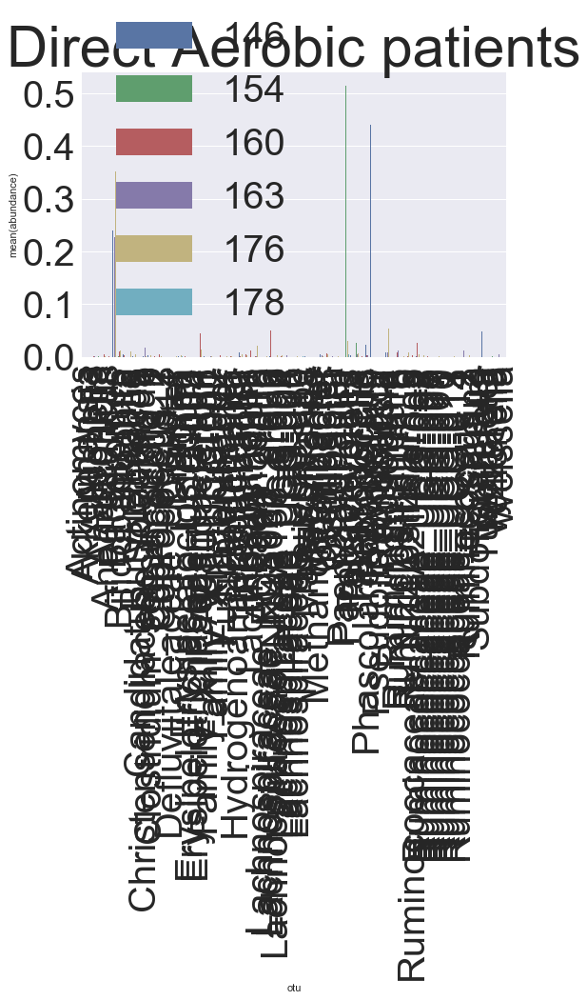

In [230]:
sns.barplot(x="otu", y="abundance", hue="patient", data=genus_engraftment_direct[genus_engraftment_direct["aerobic"]=="Aerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Direct Aerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))



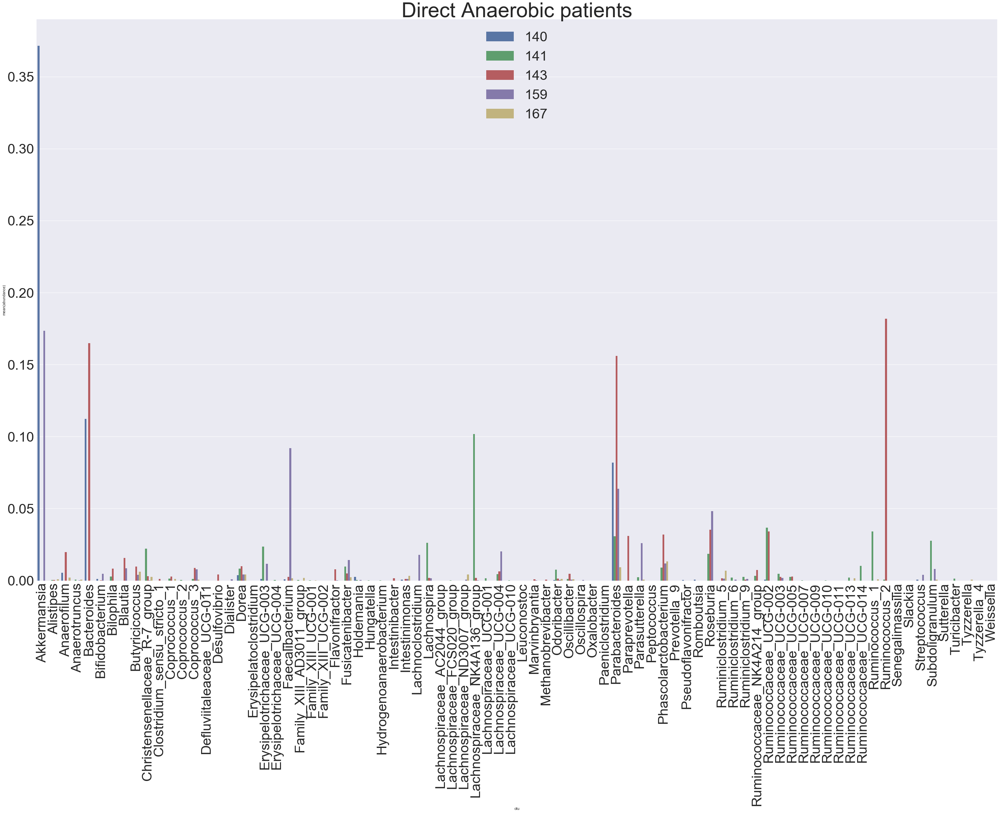

In [231]:
sns.barplot(x="otu", y="abundance", hue="patient", data=genus_engraftment_direct[genus_engraftment_direct["aerobic"]=="Anaerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Direct Anaerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))



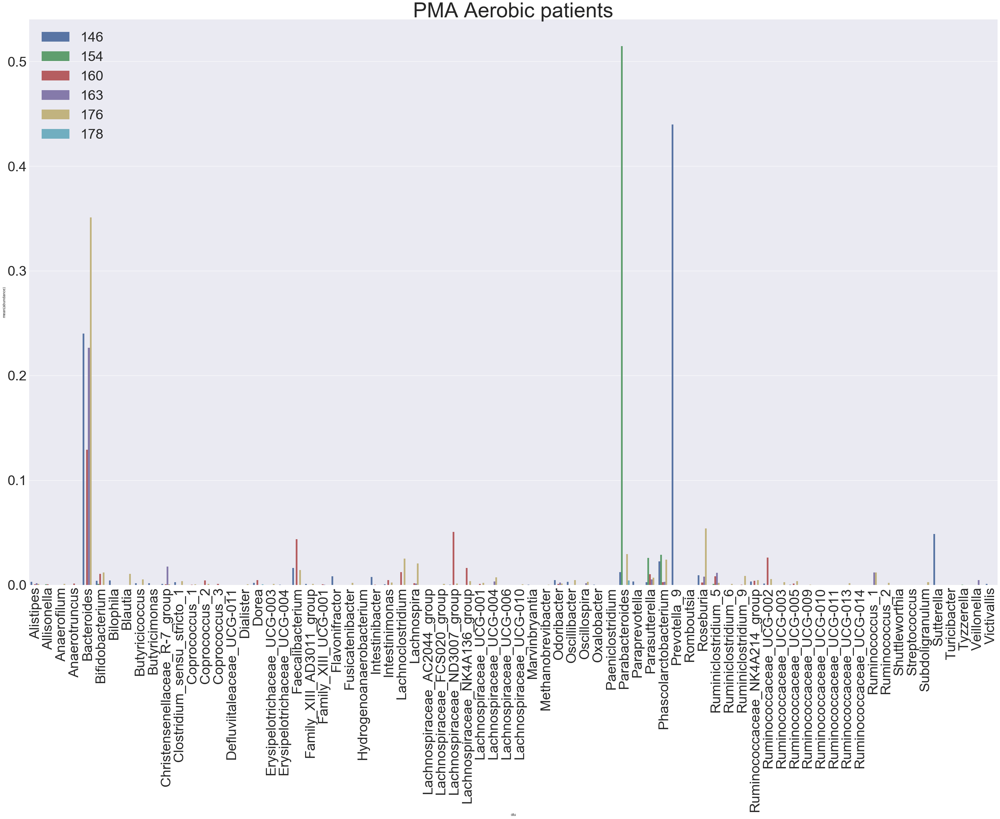

In [232]:
sns.barplot(x="otu", y="abundance", hue="patient", data=genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Aerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("PMA Aerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))


In [233]:
genus_filtered_by_patient.loc["ndc468", "Akkermansia"]

3061

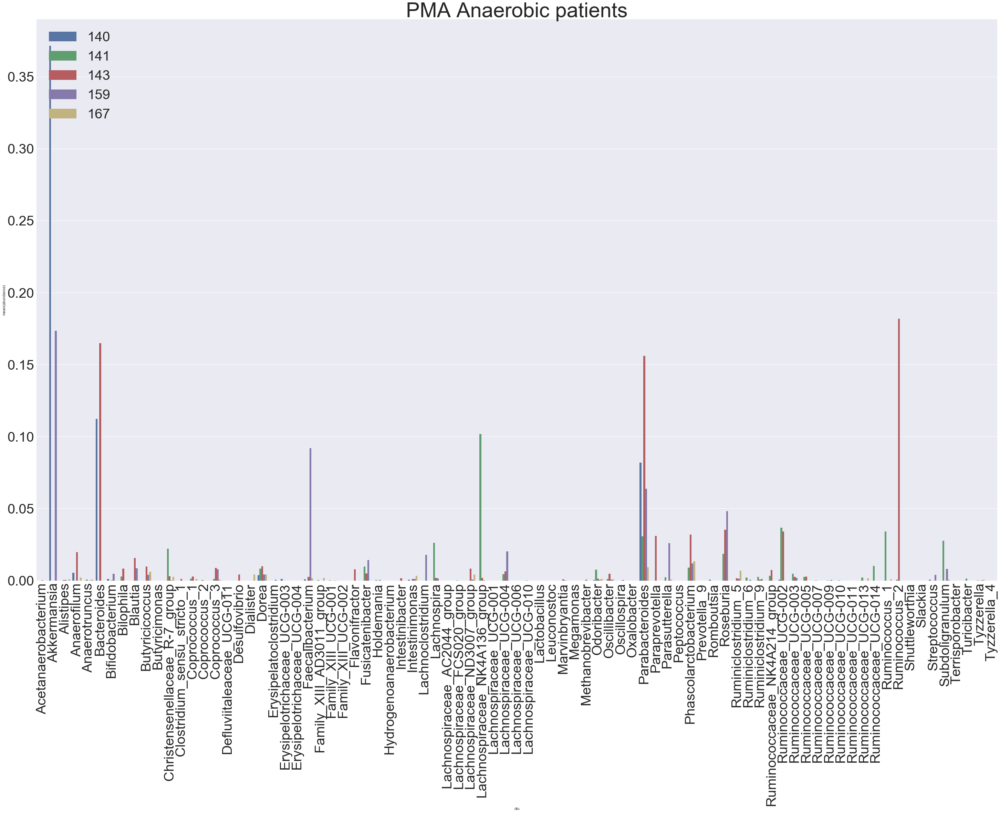

In [234]:
sns.barplot(x="otu", y="abundance", hue="patient", data=genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Anaerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("PMA Anaerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))


In [235]:
genus_engraftment_direct.head()

,patient,otu,direct/pma,count,abundance,aerobic,donor,donor_count,donor_abundance
0,176,Alistipes,direct,26,0.000703,Aerobic,485,146,0.001625
1,176,Anaerofilum,direct,29,0.000784,Aerobic,485,3,0.000033
2,176,Anaerotruncus,direct,27,0.000730,Aerobic,485,36,0.000401
3,176,Bacteroides,direct,12973,0.350906,Aerobic,485,12295,0.136839
4,176,Bifidobacterium,direct,431,0.011658,Aerobic,485,756,0.008414


### Differential engraftment of specific bugs 

In [236]:
genus_engraftment_pma_aerobic = genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Aerobic"]
all_aerobic_donor = set(genus_engraftment_pma_aerobic[genus_engraftment_pma_aerobic["donor_count"] >0].otu)
genus_engraftment_pma_anaerobic = genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Anaerobic"]
all_anaerobic_donor = set(genus_engraftment_pma_anaerobic[genus_engraftment_pma_anaerobic["donor_count"] >0].otu)

In [237]:
genus_engraftment_pma_aerobic = genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Aerobic"]
all_aerobic = set(genus_engraftment_pma_aerobic[genus_engraftment_pma_aerobic["count"] >0].otu)

In [238]:
genus_engraftment_pma_anaerobic = genus_engraftment_pma[genus_engraftment_pma["aerobic"]=="Anaerobic"]
all_anaerobic = set(genus_engraftment_pma_anaerobic[genus_engraftment_pma_anaerobic["count"] >0].otu)

In [239]:
only_in_aerobic = all_aerobic - all_anaerobic

In [240]:
only_in_anaerobic = all_anaerobic - all_aerobic

In [241]:
only_in_aerobic

{'Allisonella',
 'Butyricimonas',
 'Erysipelotrichaceae_UCG-004',
 'Lachnospiraceae_UCG-001',
 'Oxalobacter',
 'Prevotella_9',
 'Sutterella',
 'Veillonella',
 'Victivallis'}

In [242]:
only_in_anaerobic

{'Acetanaerobacterium',
 'Akkermansia',
 'Desulfovibrio',
 'Erysipelatoclostridium',
 'Holdemania',
 'Romboutsia',
 'Ruminococcaceae_UCG-007',
 'Ruminococcaceae_UCG-010',
 'Ruminococcaceae_UCG-014',
 'Streptococcus',
 'Turicibacter'}

In [243]:
in_both = all_aerobic & all_anaerobic

In [244]:
in_both

{'Alistipes',
 'Anaerofilum',
 'Anaerotruncus',
 'Bacteroides',
 'Bifidobacterium',
 'Bilophila',
 'Blautia',
 'Butyricicoccus',
 'Christensenellaceae_R-7_group',
 'Clostridium_sensu_stricto_1',
 'Coprococcus_1',
 'Coprococcus_2',
 'Coprococcus_3',
 'Dialister',
 'Dorea',
 'Erysipelotrichaceae_UCG-003',
 'Faecalibacterium',
 'Family_XIII_AD3011_group',
 'Family_XIII_UCG-001',
 'Flavonifractor',
 'Fusicatenibacter',
 'Intestinibacter',
 'Intestinimonas',
 'Lachnoclostridium',
 'Lachnospira',
 'Lachnospiraceae_FCS020_group',
 'Lachnospiraceae_ND3007_group',
 'Lachnospiraceae_NK4A136_group',
 'Lachnospiraceae_UCG-004',
 'Lachnospiraceae_UCG-010',
 'Marvinbryantia',
 'Methanobrevibacter',
 'Odoribacter',
 'Oscillibacter',
 'Oscillospira',
 'Parabacteroides',
 'Paraprevotella',
 'Parasutterella',
 'Phascolarctobacterium',
 'Roseburia',
 'Ruminiclostridium_5',
 'Ruminiclostridium_6',
 'Ruminiclostridium_9',
 'Ruminococcaceae_NK4A214_group',
 'Ruminococcaceae_UCG-002',
 'Ruminococcaceae_UCG-0

### Engraftment of Specific Bugs by Donor
Timepoint after FMT (3 days, unless not available, in which case use 4 weeks)

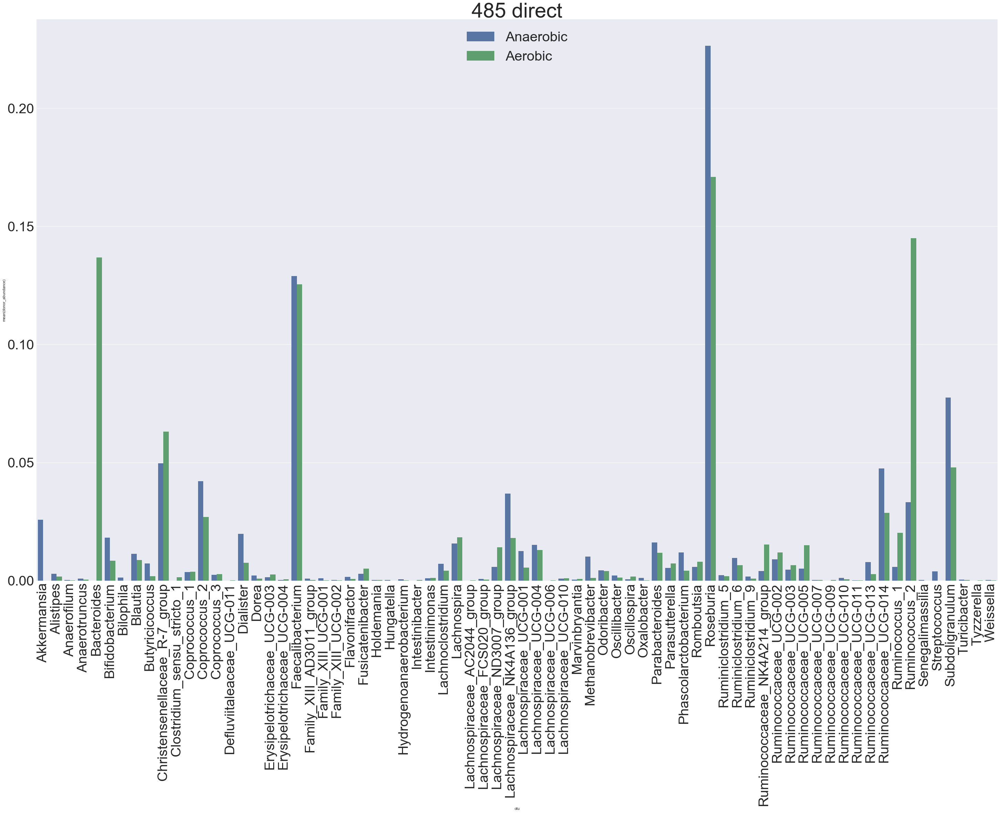

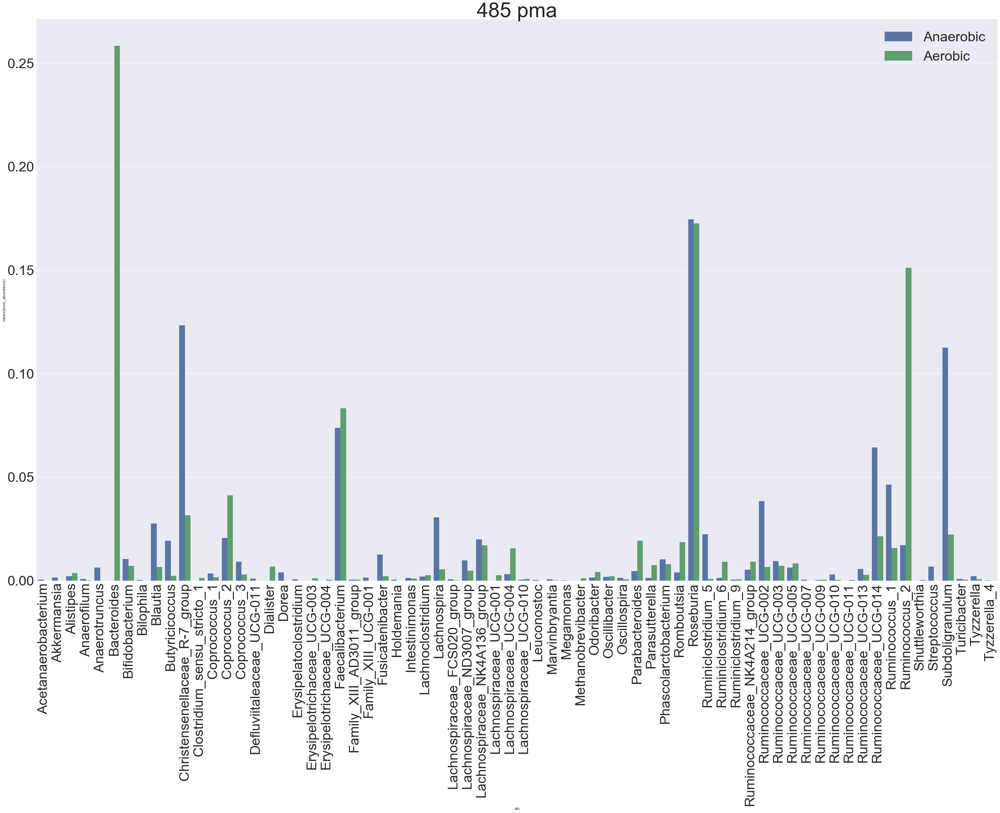

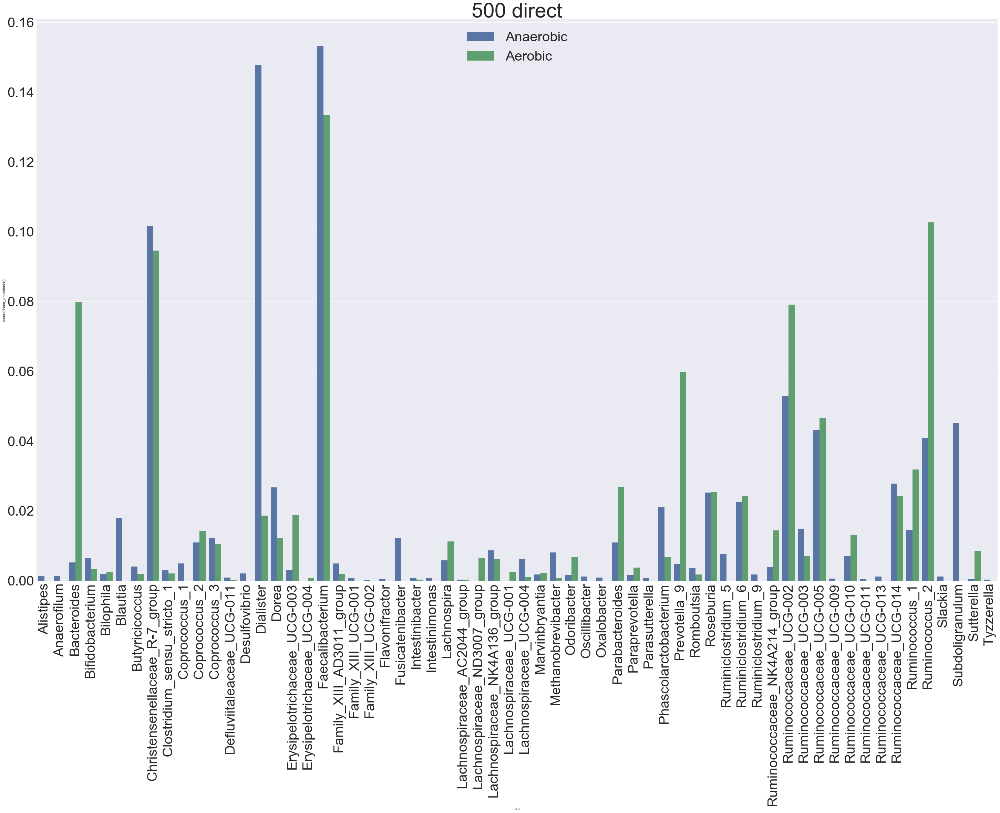

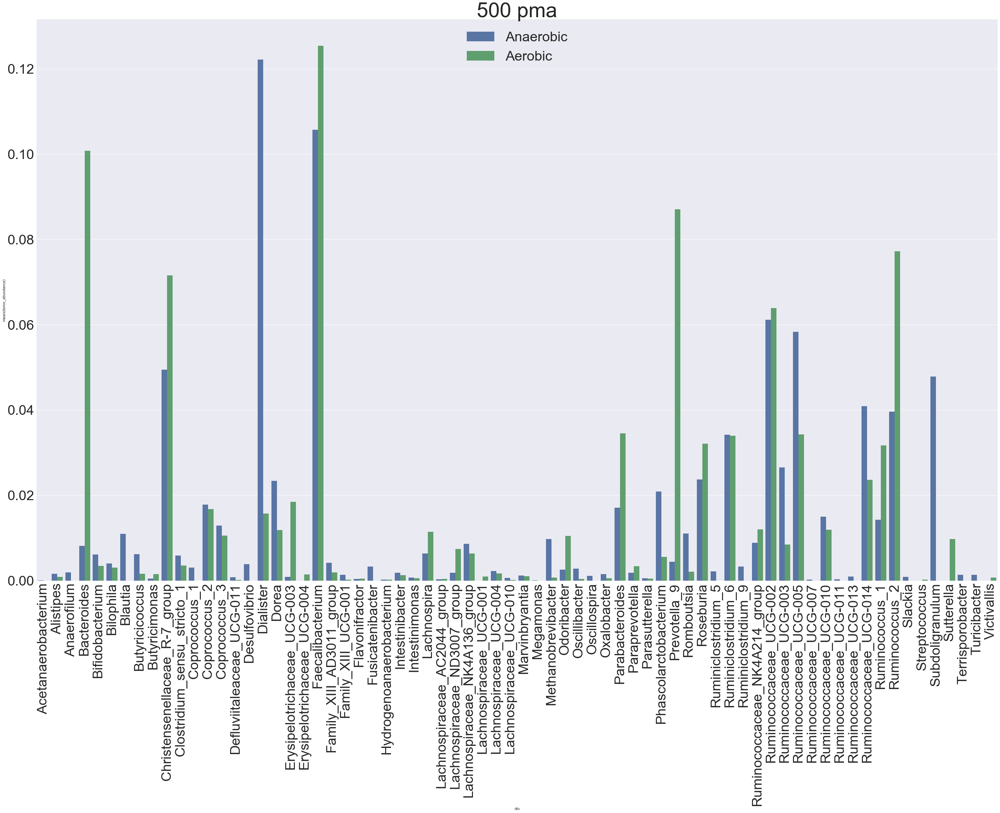

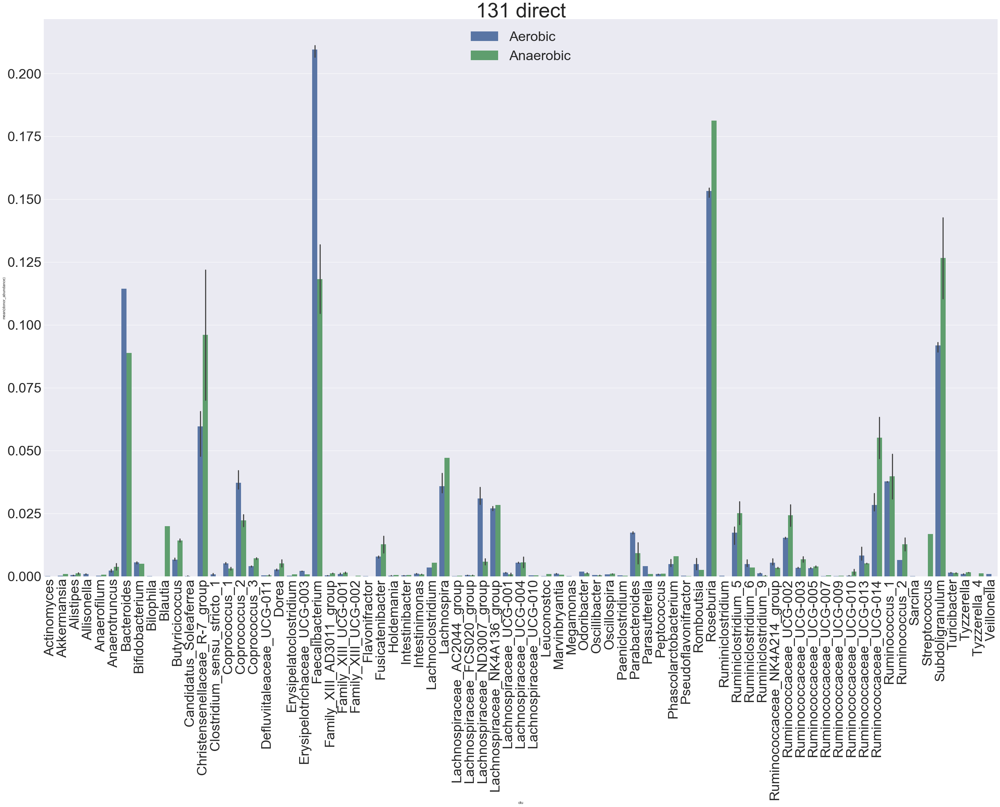

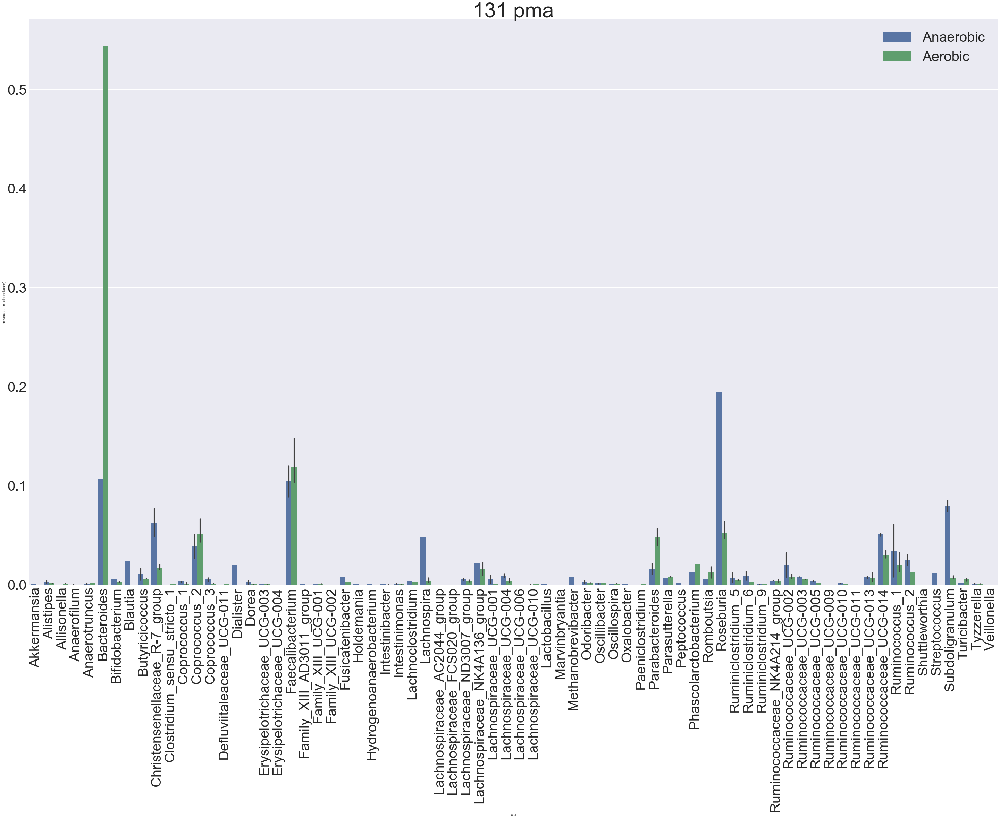

In [245]:
#donors
donors = [485, 500, 131]
with PdfPages("differential_genera_abundance_by_donor.pdf") as pp:
    for donor in donors:
        for dp in ["direct", "pma"]:
            df = genus_engraftment[(genus_engraftment["donor"] == donor) & (genus_engraftment["direct/pma"] == dp)]
            sns.barplot(x="otu", y="donor_abundance", hue="aerobic", data=df.sort_values(by="otu"))
            plt.xticks(rotation=90, fontsize=40)
            plt.yticks(fontsize=40)
            plt.legend(fontsize=40)
            plt.title("{} {}".format(donor, dp), fontsize=60)
            plt.show()
            plt.figure(figsize=(50,30))
#             pp.savefig()
#             plt.close()


        

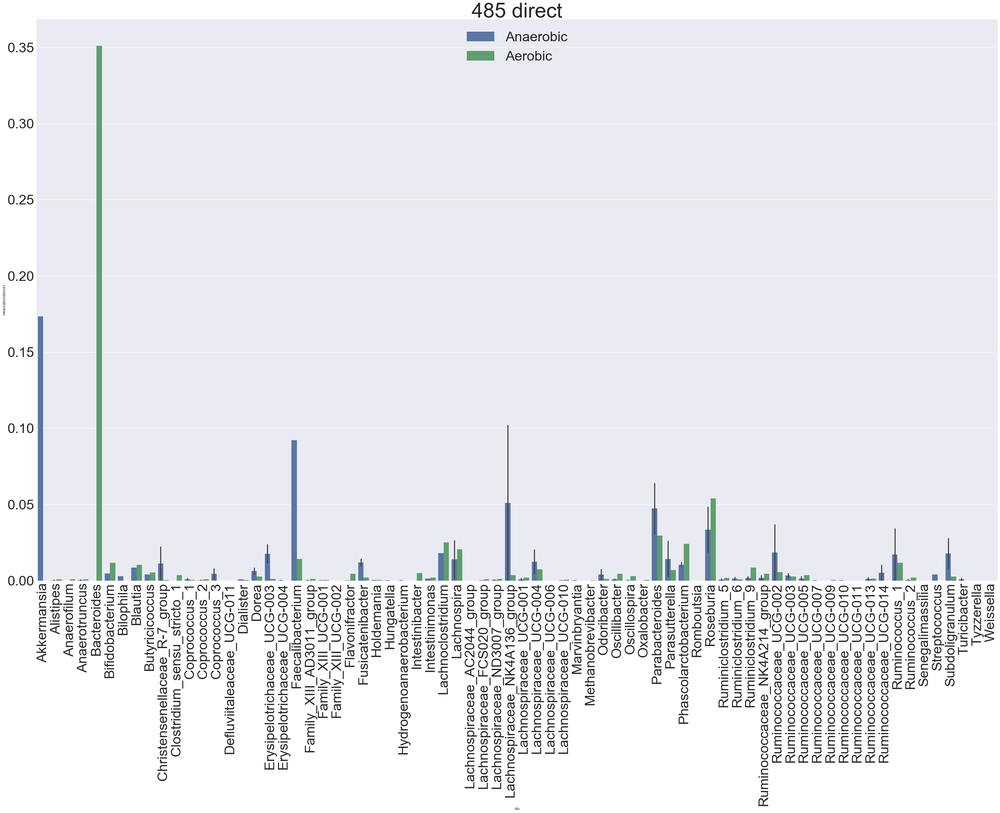

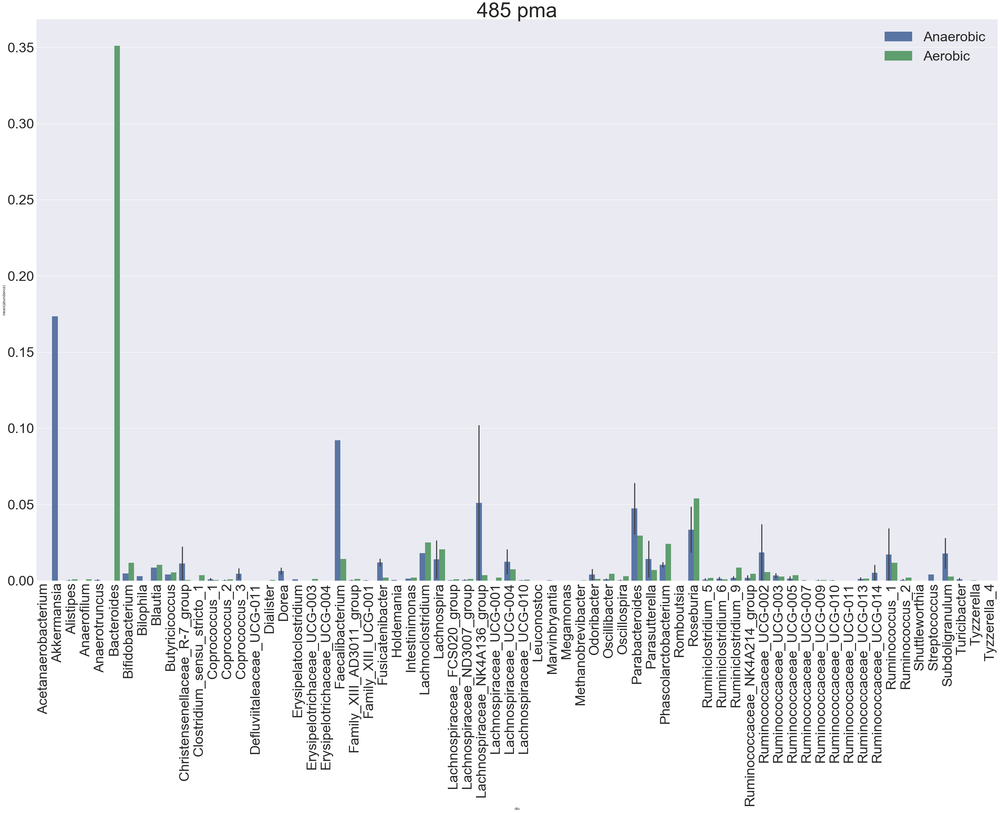

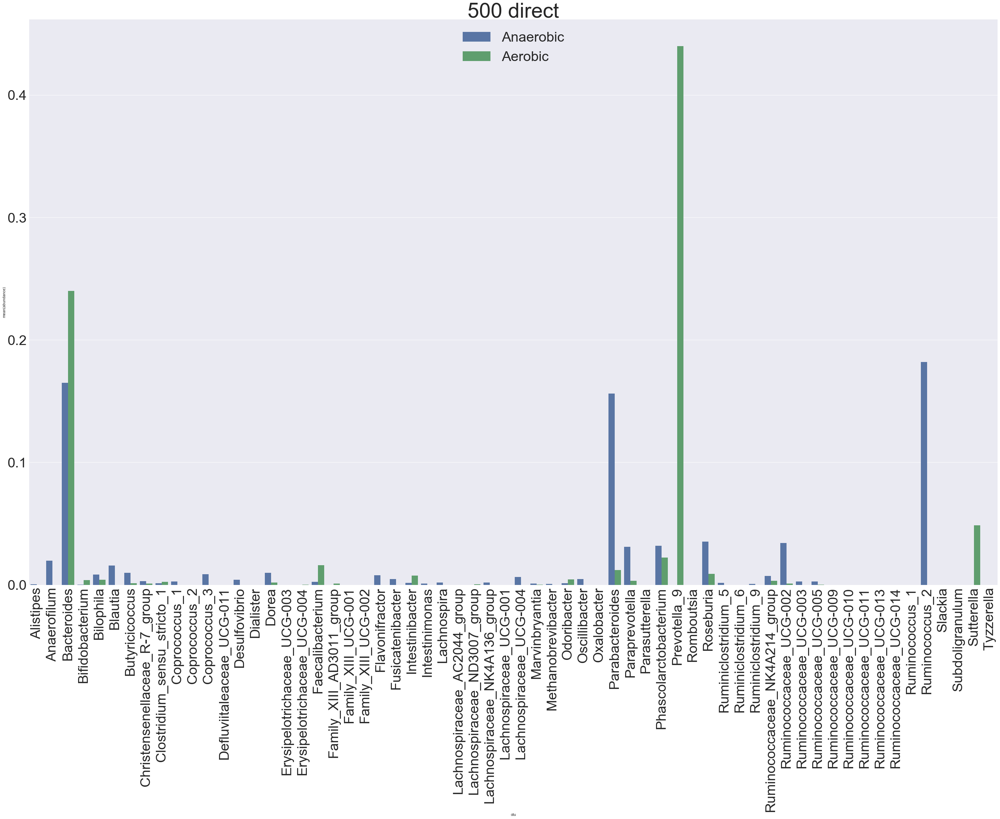

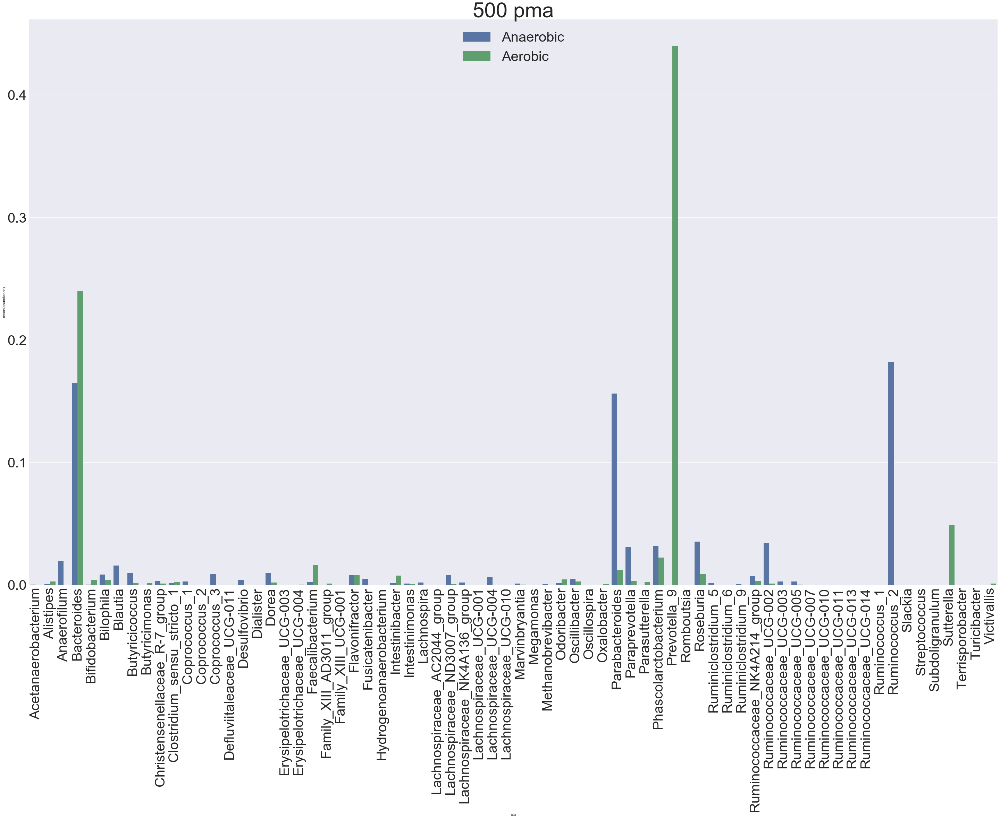

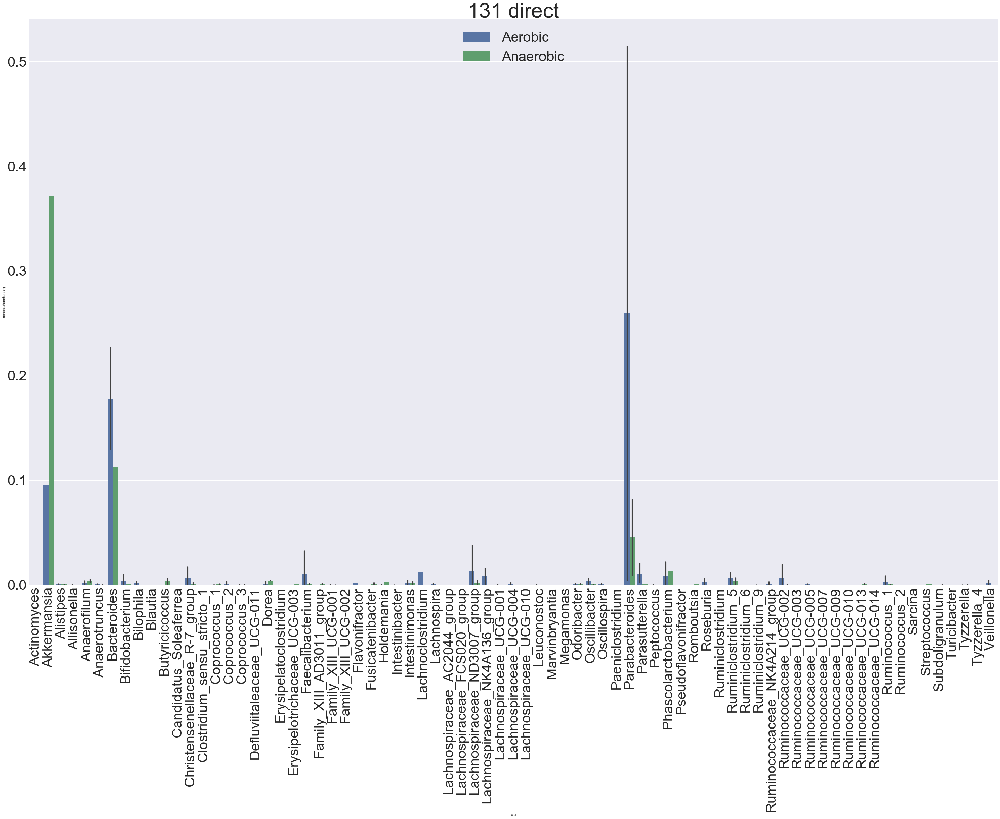

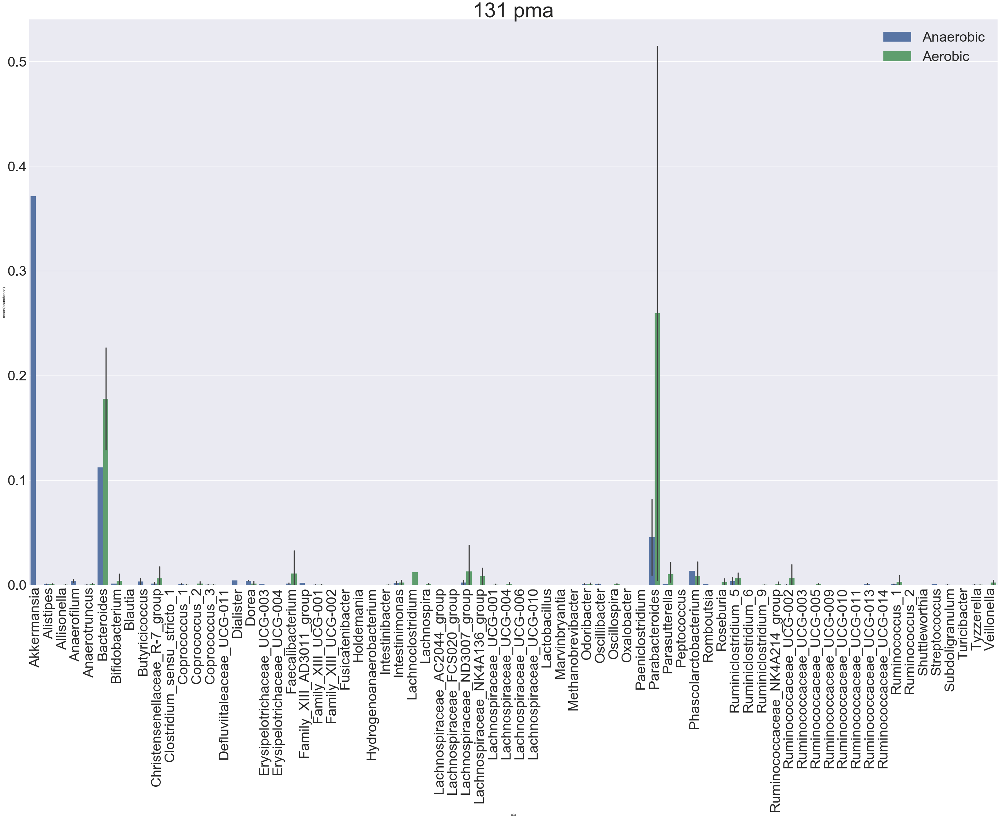

In [246]:
#patients
donors = [485, 500, 131]
with PdfPages("differential_genera_abundance_by_patient.pdf") as pp:
    for donor in donors:
        for dp in ["direct", "pma"]:
            df = genus_engraftment[(genus_engraftment["donor"] == donor) & (genus_engraftment["direct/pma"] == dp)]
            sns.barplot(x="otu", y="abundance", hue="aerobic", data=df.sort_values(by="otu"))
            plt.xticks(rotation=90, fontsize=40)
            plt.yticks(fontsize=40)
            plt.legend(fontsize=40)
            plt.title("{} {}".format(donor, dp), fontsize=60)
            plt.show()
            plt.figure(figsize=(50,30))
#             pp.savefig()
#             plt.close()

        

### Log-fold differences between anaerobic and aerobic by donor 

In [247]:
genus_engraftment_direct_averaged = genus_engraftment_direct.drop(['patient', 'direct/pma'], axis=1)
genus_engraftment_direct_averaged["count"] = genus_engraftment_direct_averaged['count'].astype(int)
genus_engraftment_direct_averaged = genus_engraftment_direct_averaged.groupby(['donor', 'aerobic', 'otu']).mean().reset_index()

In [248]:
genus_engraftment_direct_averaged["log_abundance"] = np.log(genus_engraftment_direct_averaged["abundance"])

/Users/vivzhong/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


In [249]:
def genus_engraftment_calculate_lfd(df):
    """
    df (DataFrame): columns are "donor", "aerobic", "otu", "abundance" (average of all patients for the same donor and FMT type), 
        "donor_abundance", "log_abundance" (patient)
    """
    genus_engraftment_lfd = pd.DataFrame(columns=["donor","otu", "lfd", "only"])
    for donor in df.donor.unique(): #every donor
        for otu in df[df["donor"] == donor].otu: #every otu
            try:
                anaerobic_id = df.index[(df["donor"] == donor) & (df["otu"] == otu) & (df["aerobic"] == "Anaerobic")][0]
                anaerobic = df.loc[anaerobic_id,"log_abundance"]
            except: 
                anaerobic = -np.inf
            try:
                aerobic_id = df.index[(df["donor"] == donor) & (df["otu"] == otu) & (df["aerobic"] == "Aerobic")][0]   
                aerobic = df.loc[aerobic_id,"log_abundance"]
            except:
                aerobic = -np.inf

            if aerobic == -np.inf and anaerobic == -np.inf:
                genus_engraftment_lfd = genus_engraftment_lfd.append({"donor":donor, "otu":otu, "lfd":np.nan, "only":np.nan}, ignore_index=True)
            elif aerobic == -np.inf:
                genus_engraftment_lfd = genus_engraftment_lfd.append({"donor":donor, "otu":otu, "lfd":np.nan, "only":"Anaerobic"}, ignore_index=True)
            elif anaerobic == -np.inf:
                genus_engraftment_lfd = genus_engraftment_lfd.append({"donor":donor, "otu":otu, "lfd":np.nan, "only":"Aerobic"}, ignore_index=True)
            else:
                lfd = anaerobic - aerobic
                genus_engraftment_lfd = genus_engraftment_lfd.append({"donor":donor, "otu":otu, "lfd":lfd, "only":np.nan}, ignore_index=True)
    return genus_engraftment_lfd

In [250]:
genus_engraftment_direct_lfd = genus_engraftment_calculate_lfd(genus_engraftment_direct_averaged)

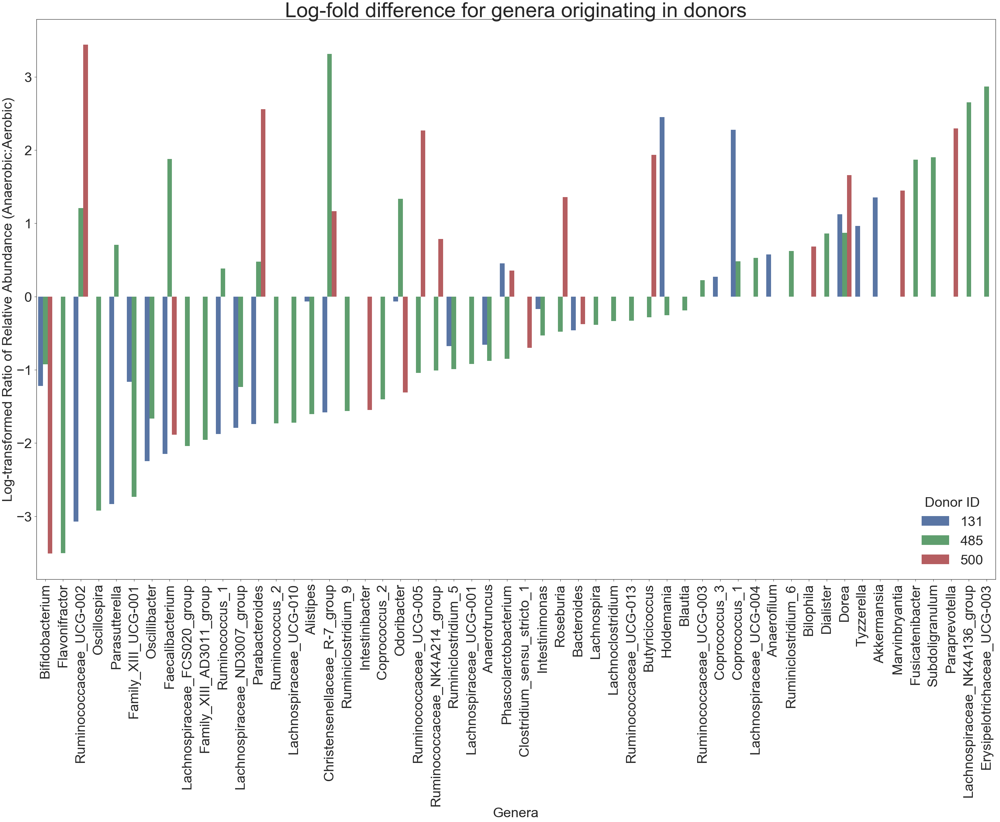

In [404]:
sns.barplot(x="otu", y="lfd", hue="donor",data=genus_engraftment_direct_lfd[pd.isnull(genus_engraftment_direct_lfd["lfd"])==False].sort_values(by="lfd"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
leg = plt.legend(fontsize=40, title="Donor ID")

leg.get_title().set_fontsize(40)
plt.title("Log-fold difference for genera originating in donors", fontsize=60)
plt.ylabel("Log-transformed Ratio of Relative Abundance (Anaerobic:Aerobic)", fontsize=40)
plt.xlabel("Genera", fontsize=40)
plt.show()
plt.figure(figsize=(50,30))

### In donor but no patient

In [252]:
genus_engraftment_pma_averaged = genus_engraftment_pma.drop(['patient', 'direct/pma'], axis=1)
genus_engraftment_pma_averaged["count"] = genus_engraftment_pma_averaged['count'].astype(int)


In [253]:
all_genus_engraftment_pma_all_donors_donor_only_averaged = genus_engraftment_pma_averaged[genus_engraftment_pma_averaged.index.isin(all_genus_engraftment_pma_all_donors_donor_only.index)]
all_genus_engraftment_pma_all_donors_donor_only_averaged = all_genus_engraftment_pma_all_donors_donor_only_averaged.groupby(['donor', 'aerobic', 'otu']).mean().reset_index()

In [254]:
all_genus_engraftment_pma_all_donors_donor_only_averaged["log_abundance"] = np.log(all_genus_engraftment_pma_all_donors_donor_only_averaged["abundance"])
all_genus_engraftment_pma_all_donors_donor_only_averaged_lfd = genus_engraftment_calculate_lfd(all_genus_engraftment_pma_all_donors_donor_only_averaged)

/Users/vivzhong/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:1: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


In [255]:
genus_engraftment_pma_lfd

,donor,otu,lfd,only
0,131,Alistipes,-0.064426,NaN
1,131,Allisonella,NaN,Aerobic
2,131,Anaerotruncus,-0.655056,NaN
3,131,Bacteroides,-0.460343,NaN
4,131,Bifidobacterium,-1.219630,NaN
5,131,Butyricicoccus,NaN,Anaerobic
6,131,Christensenellaceae_R-7_group,-1.582540,NaN
7,131,Clostridium_sensu_stricto_1,NaN,NaN
8,131,Coprococcus_1,2.278156,NaN
9,131,Coprococcus_2,NaN,Aerobic


In [256]:
genus_engraftment_pma_averaged = genus_engraftment_pma_averaged.groupby(['donor', 'aerobic', 'otu']).mean().reset_index()
genus_engraftment_pma_averaged["log_abundance"] = np.log(genus_engraftment_pma_averaged["abundance"])
genus_engraftment_pma_lfd = genus_engraftment_calculate_lfd(genus_engraftment_pma_averaged)

/Users/vivzhong/anaconda/envs/py35/lib/python3.5/site-packages/ipykernel/__main__.py:2: RuntimeWarning: divide by zero encountered in log
  from ipykernel import kernelapp as app


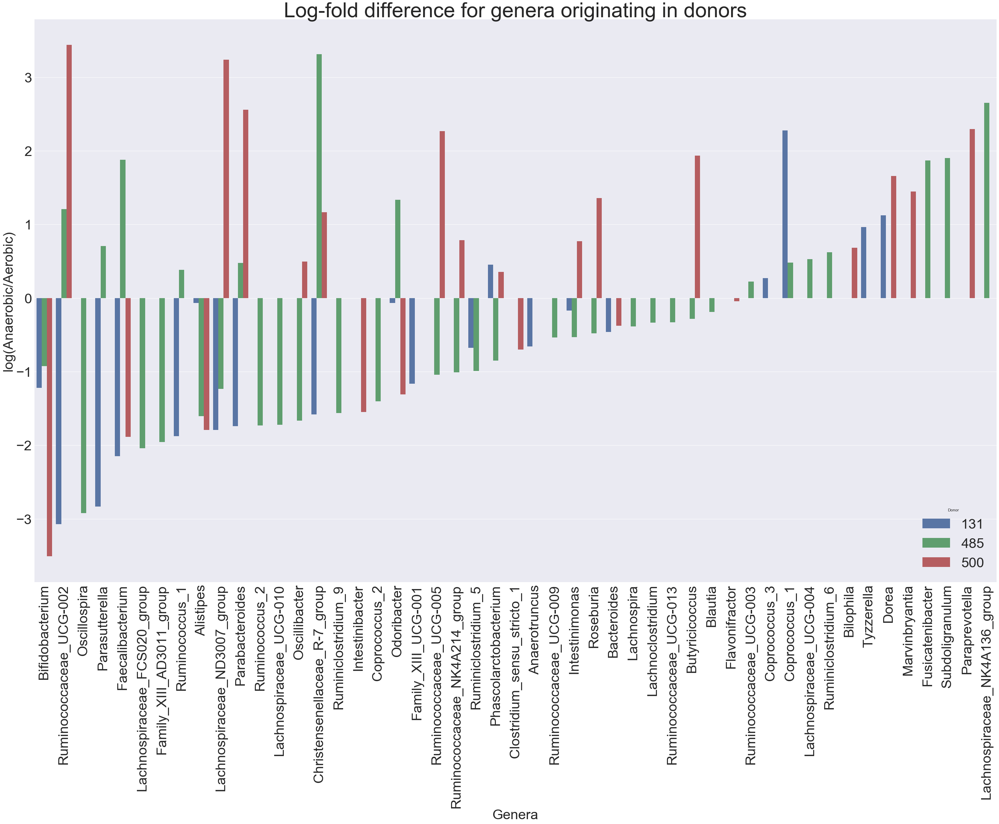

In [388]:
sns.barplot(x="otu", y="lfd", hue="donor", data=genus_engraftment_pma_lfd[pd.isnull(genus_engraftment_pma_averaged_lfd["lfd"])==False].sort_values(by="lfd"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40, title="Donor")
plt.xlabel("Genera", fontsize=40)
plt.title("Log-fold difference for genera originating in donors", fontsize=60)
plt.ylabel("log(Anaerobic/Aerobic)", fontsize=40)
plt.show()
plt.figure(figsize=(50,30))

#### Family Engraftment Aerobic vs Anaerobic

In [258]:
family_engraftment = engraftment_capability(family, family_abundance, metadata)
family_engraftment_pma = family_engraftment[family_engraftment["direct/pma"] == "pma"]

index 0 is out of bounds for axis 0 with size 0


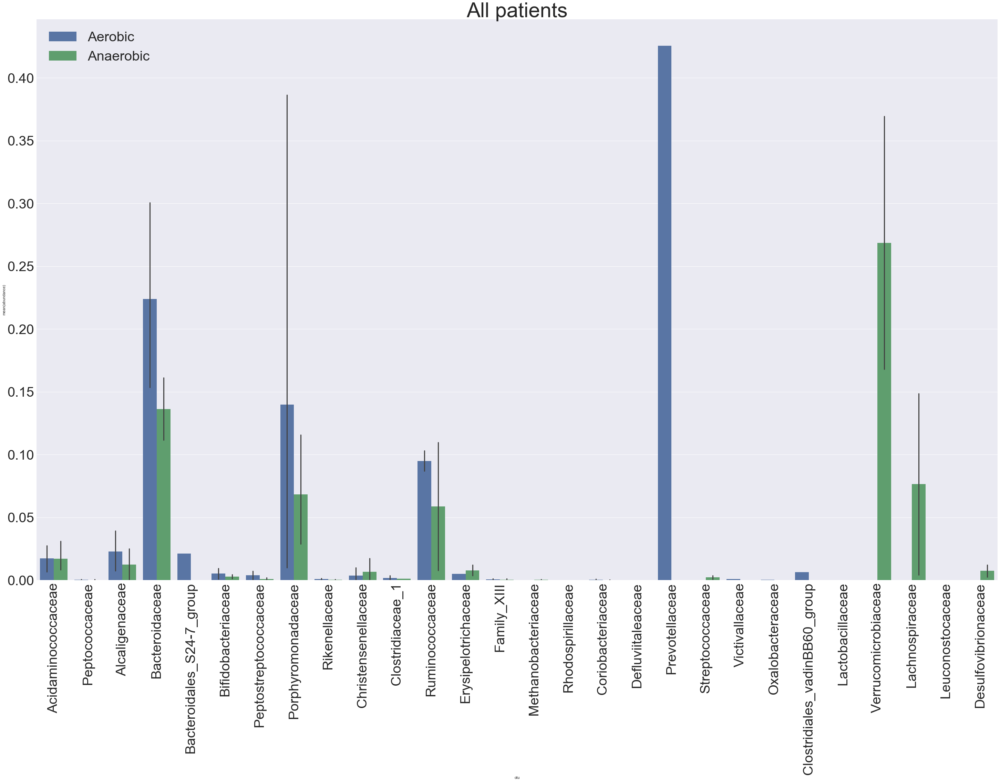

In [259]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=family_engraftment_pma)
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("All patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




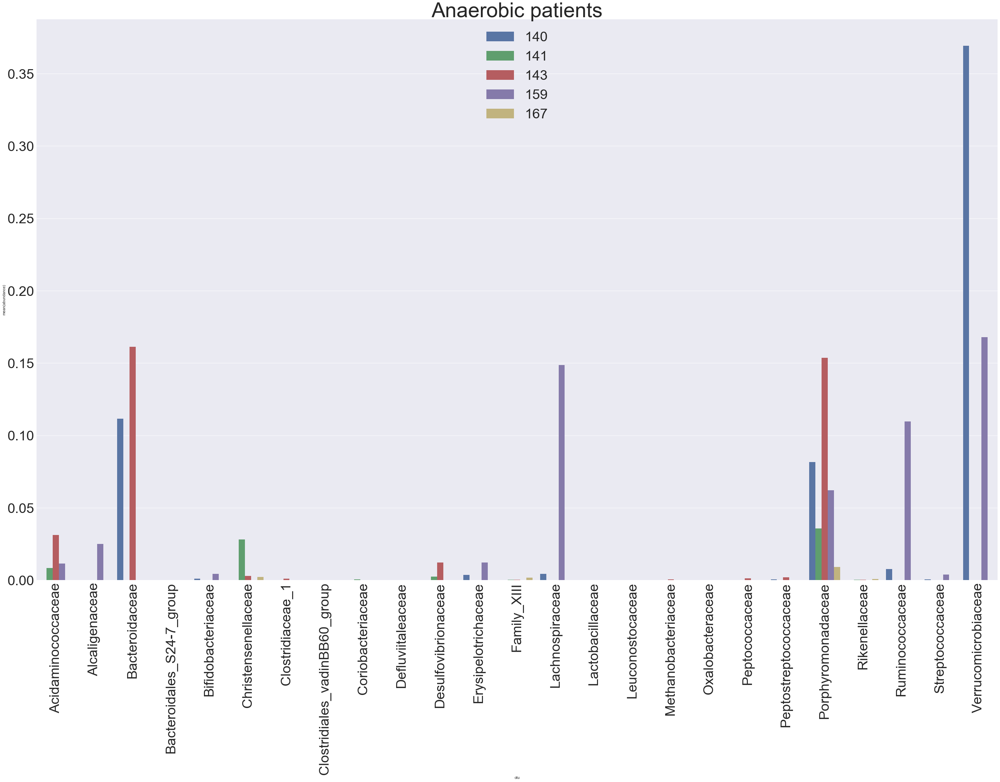

In [260]:
sns.barplot(x="otu", y="abundance", hue="patient", data=family_engraftment_pma[family_engraftment_pma["aerobic"]=="Anaerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Anaerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))



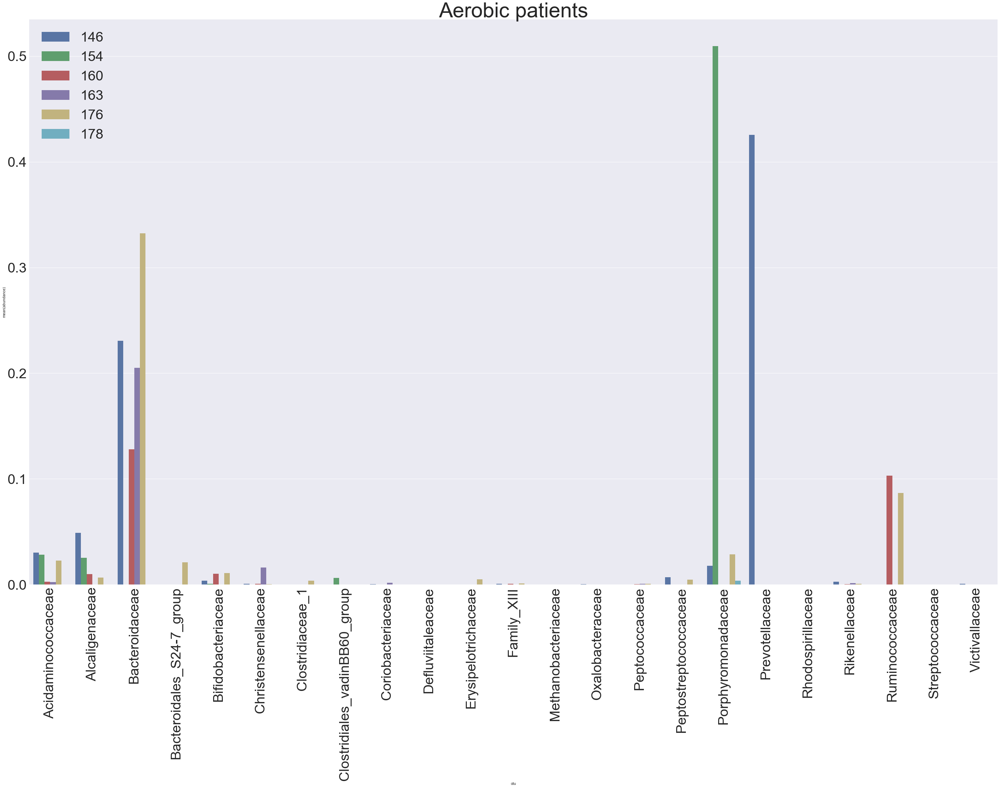

In [261]:
sns.barplot(x="otu", y="abundance", hue="patient", data=family_engraftment_pma[family_engraftment_pma["aerobic"]=="Aerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Aerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




#### Seq Vars

In [262]:
seq_var_engraftment = engraftment_capability(seq_freq, seq_freq_abundance, metadata)
seq_var_engraftment_pma = seq_var_engraftment[seq_var_engraftment["direct/pma"] == "pma"]

index 0 is out of bounds for axis 0 with size 0


In [263]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=seq_var_engraftment_pma)
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("All patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [264]:
sns.barplot(x="otu", y="abundance", hue="patient", data=seq_var_engraftment_pma[seq_var_engraftment_pma["aerobic"]=="Aerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Aerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [265]:
sns.barplot(x="otu", y="abundance", hue="patient", data=seq_var_engraftment_pma[seq_var_engraftment_pma["aerobic"]=="Anaerobic"].sort_values(by="otu"))
plt.xticks(rotation=90, fontsize=40)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Anaerobic patients", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [267]:
genus_engraftment_aerobic = genus_engraftment_pma[genus_engraftment_pma['aerobic']=="Aerobic"].set_index("otu")

In [268]:
genus_engraftment_anaerobic = genus_engraftment_pma[genus_engraftment_pma['aerobic']=="Anaerobic"].set_index("otu")

In [269]:
genus_engraftment_aerobic.head()

,patient,direct/pma,count,abundance,aerobic,donor,donor_count,donor_abundance
otu,,,,,,,,
Shuttleworthia,176,pma,0,0.000000,Aerobic,485,6,0.000249
Alistipes,176,pma,26,0.000703,Aerobic,485,87,0.003613
Subdoligranulum,176,pma,98,0.002651,Aerobic,485,534,0.022179
Anaerofilum,176,pma,29,0.000784,Aerobic,485,2,0.000083
Turicibacter,176,pma,0,0.000000,Aerobic,485,12,0.000498


#### Environmental Strains

In [270]:
def engraftment_capability_environment(otu_table_counts, otu_table_abundance, metadata):
    engraftment_capability_environment_df = pd.DataFrame(columns=["patient","otu", "direct/pma", "count", "abundance", "aerobic"])
    other = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
    for i in otu_table_counts.index:
        if metadata.loc[i, "timepoint"] == "3 days":
            other[metadata.loc[i, "person_id"]] = [list(set(list(otu_table_counts.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0]))),list(set(list(otu_table_counts.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0])))]
    for patient, donor_seqs in other.items():
        try:
            sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == "3 days")][0]
        except Exception as e:
            print(e)
            sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == "4 weeks")][0]
        aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
        for d in donor_seqs[0]:
            count = otu_table_counts.loc[sample_id, otu_table_counts.columns[d]]
            abundance = otu_table_abundance.loc[sample_id, otu_table_counts.columns[d]]
            engraftment_capability_environment_df = engraftment_capability_environment_df.append({"patient":patient, "otu":otu_table_counts.columns[d],"direct/pma":"direct", "count":count, "abundance":abundance, "aerobic":aerobic}, ignore_index=True)
        for p in donor_seqs[1]:
            count = otu_table_counts.loc[sample_id, otu_table_counts.columns[p]]
            abundance = otu_table_abundance.loc[sample_id, otu_table_counts.columns[p]]
            engraftment_capability_environment_df = engraftment_capability_environment_df.append({"patient":patient, "otu":otu_table_counts.columns[p],"direct/pma":"pma", "count":count, "abundance":abundance, "aerobic":aerobic}, ignore_index=True)
        
            
    return engraftment_capability_environment_df



#### Strains in Anaerobic vs Aerobic Donors

In [271]:
strains_in_anaerobic_donors = unique(genus_engraftment_anaerobic.index)

In [272]:
strains_in_aerobic_donors = unique(genus_engraftment_aerobic.index)

In [273]:
len(strains_in_aerobic_donors)

74

In [274]:
len(strains_in_anaerobic_donors)

83

In [275]:
genus_abundance.loc["ndc407"].index
    

Index(['Acetanaerobacterium', 'Acidaminococcus', 'Actinomyces',
       'Adlercreutzia', 'Akkermansia', 'Alistipes', 'Allisonella',
       'Anaerococcus', 'Anaerofilum', 'Anaerofustis',
       ...
       'Synergistes', 'Terrisporobacter', 'Trueperella', 'Turicibacter',
       'Tyzzerella', 'Tyzzerella_4', 'Varibaculum', 'Veillonella',
       'Victivallis', 'Weissella'],
      dtype='object', name='Genus', length=146)

In [276]:
def donor_composition(otu_table_counts, otu_table_abundance, metadata):

    donor_composition_df = pd.DataFrame(columns=["donor", "donor_sample","otu", "direct/pma", "count", "abundance", "aerobic"])
    donor_seqs = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma
    for sample_id in otu_table_counts.index:
        if metadata.loc[sample_id, "donor_v_patient"] == "donor":            
            aerobic = metadata.loc[sample_id, "anaerobic_proc"]
            pma = metadata.loc[sample_id, "pma"]
            for otu in otu_table_abundance.loc[sample_id].index:
                count = otu_table_counts.loc[sample_id, otu]
                abundance = otu_table_abundance.loc[sample_id, otu]
                donor_composition_df = donor_composition_df.append({"donor":int(metadata.loc[sample_id, "person_id"]), "donor_sample":sample_id,"otu":otu,"direct/pma":pma, "count":count, "abundance":abundance, "aerobic":aerobic}, ignore_index=True)            
    return donor_composition_df




In [277]:
genus_donor_composition = donor_composition(genus_filtered_by_patient, genus_abundance, metadata)

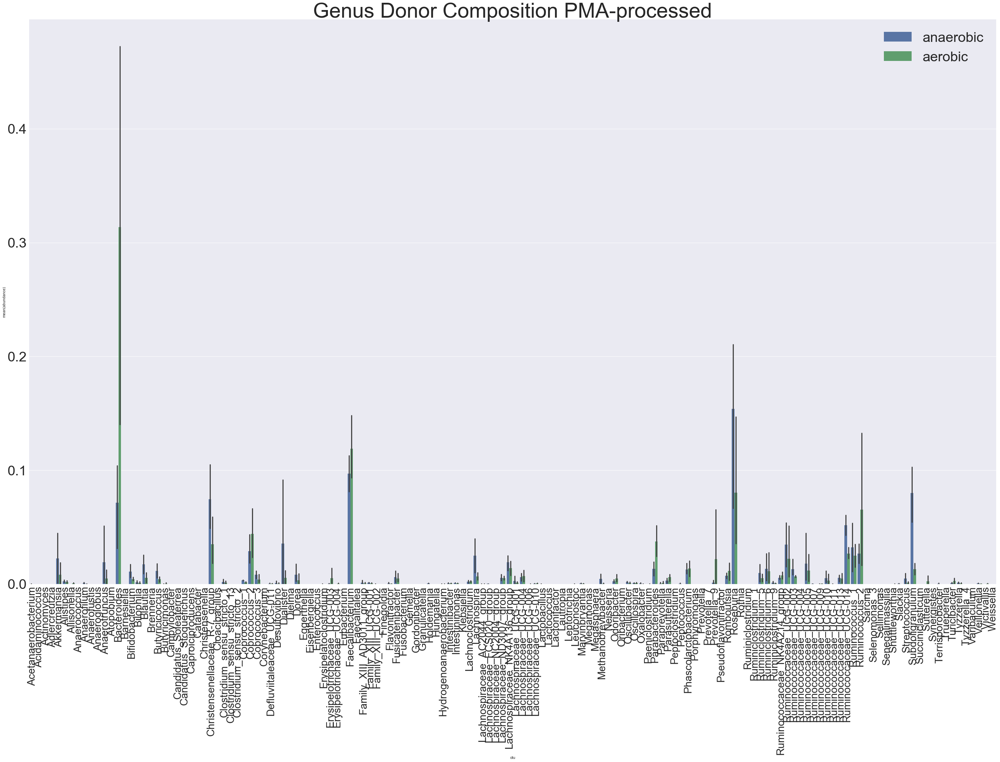

In [278]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=genus_donor_composition[genus_donor_composition["direct/pma"]=="pma"])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition PMA-processed", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))



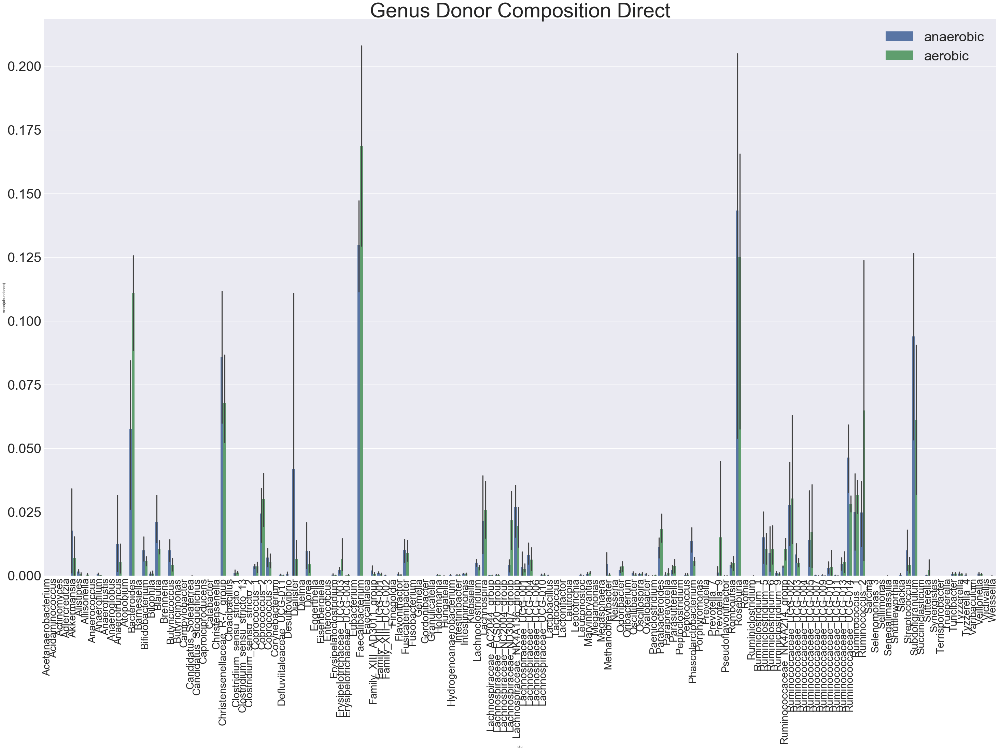

In [279]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=genus_donor_composition[genus_donor_composition["direct/pma"]=="direct"])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition Direct", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




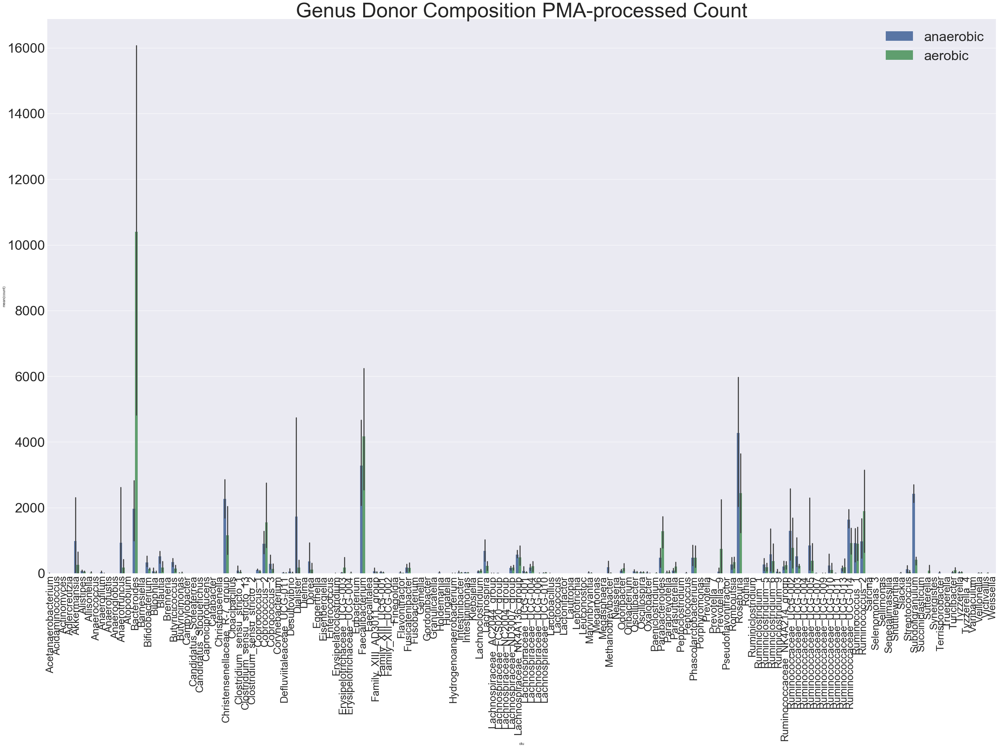

In [280]:
sns.barplot(x="otu", y="count", hue="aerobic", data=genus_donor_composition[genus_donor_composition["direct/pma"]=="pma"])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition PMA-processed Count", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




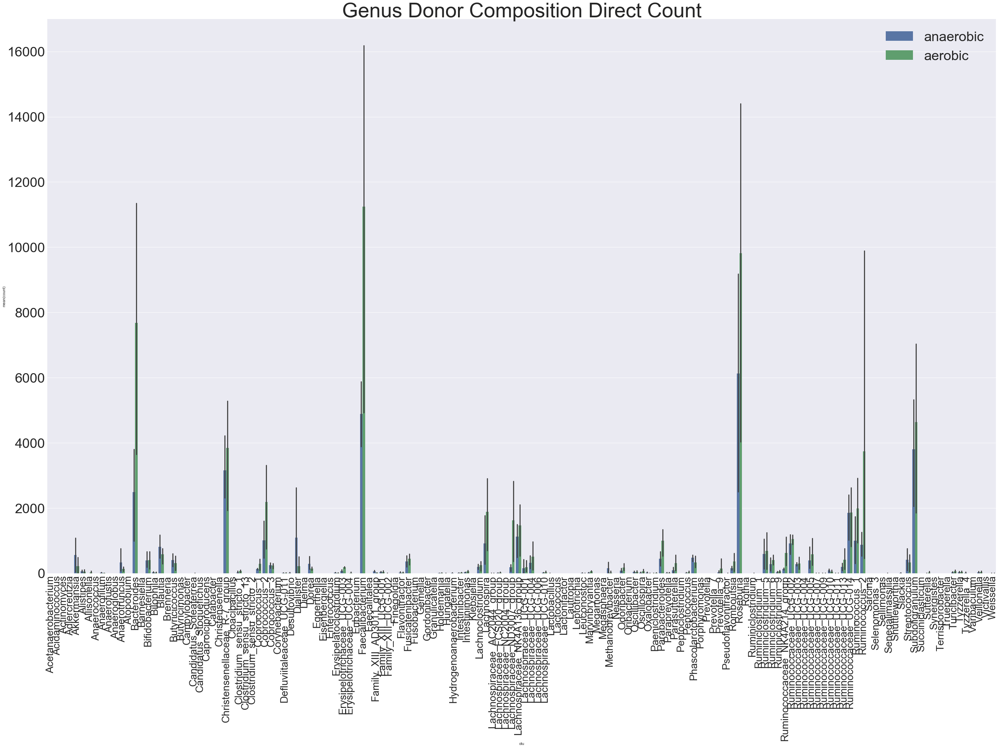

In [281]:
sns.barplot(x="otu", y="count", hue="aerobic", data=genus_donor_composition[genus_donor_composition["direct/pma"]=="direct"])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition Direct Count", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))





In [282]:
genus_donor_composition_pma = genus_donor_composition[genus_donor_composition["direct/pma"]=="pma"]

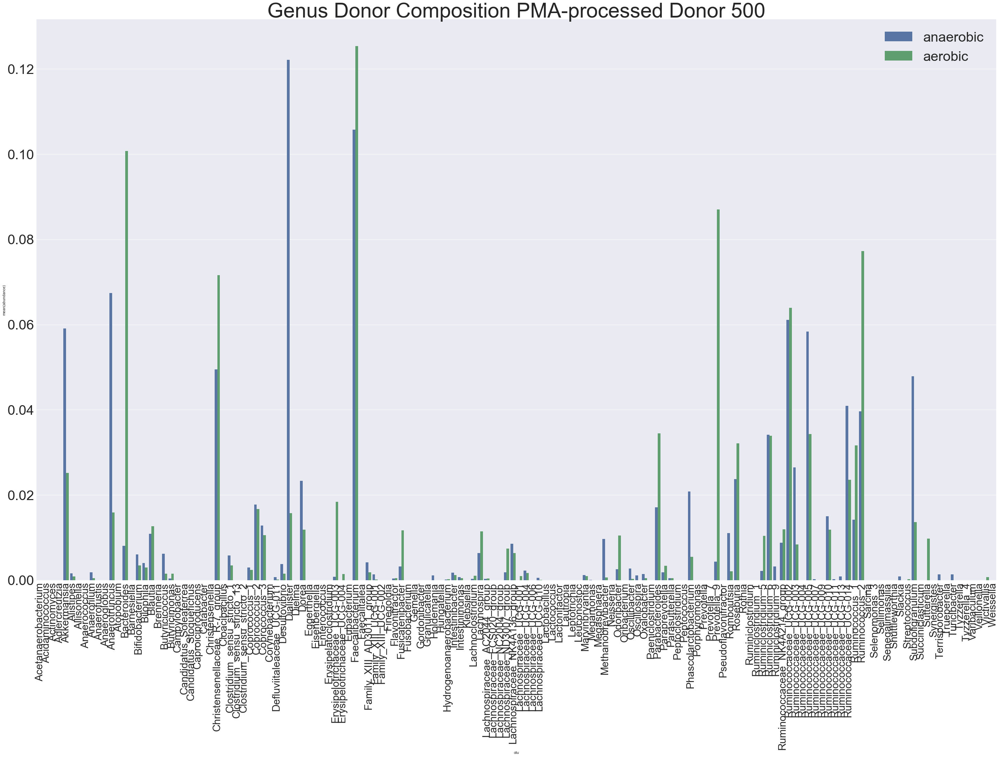

In [283]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=genus_donor_composition_pma[genus_donor_composition_pma["donor"]==500])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition PMA-processed Donor 500", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))




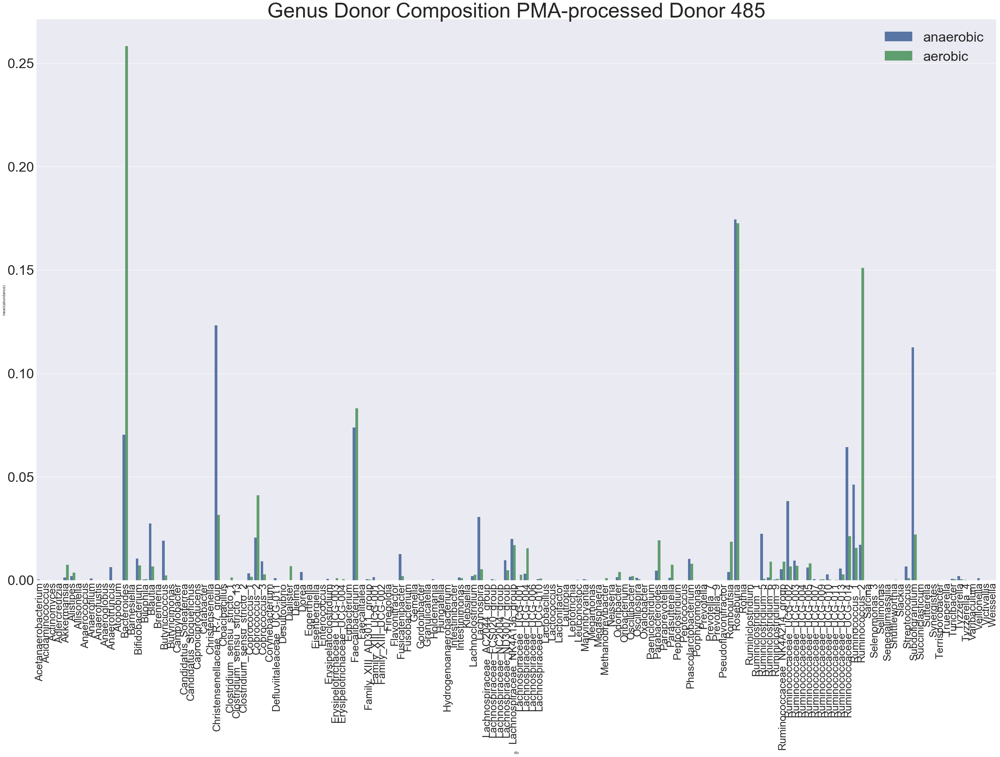

In [284]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=genus_donor_composition_pma[genus_donor_composition_pma["donor"]==485])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition PMA-processed Donor 485", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))





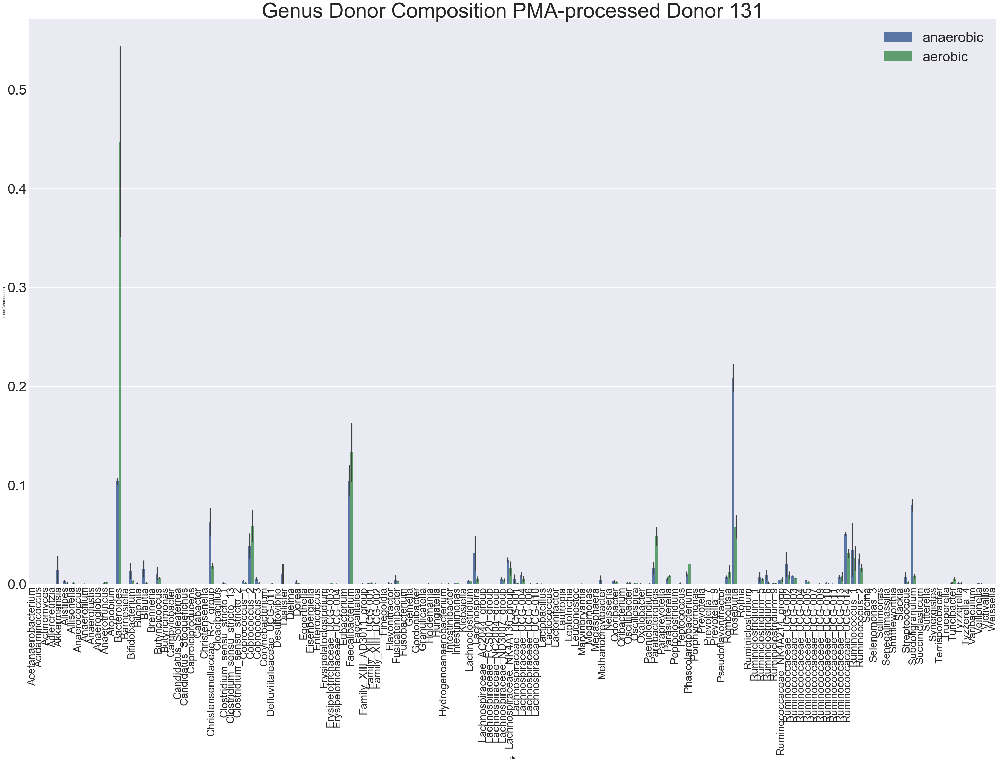

In [285]:
sns.barplot(x="otu", y="abundance", hue="aerobic", data=genus_donor_composition_pma[genus_donor_composition_pma["donor"]==131])
plt.xticks(rotation=90, fontsize=30)
plt.yticks(fontsize=40)
plt.legend(fontsize=40)
plt.title("Genus Donor Composition PMA-processed Donor 131", fontsize=60)
plt.show()
plt.figure(figsize=(50,30))





### Donor vs. Recipient Composition Time Series

In [355]:
def composition_by_source(otu_table_counts, otu_table_abundance, metadata, pdf):
    composition_summary_df = pd.DataFrame(columns=["patient", "direct/pma", "donor_abundance", "both_abundance", "patient_abundance", "other", "aerobic", "timepoint"])
    with PdfPages(pdf) as pp:
        donor_only = {} #dict where keys are patient ids and values are lists of indices representing seq vars that are in 
                    #the corresponding donor but not in the patient originally, where the first list is direct and the second pma 
        for i in otu_table_counts.index:
            if metadata.loc[i, "timepoint"] == "Pre-FMT":
                donor_only[metadata.loc[i, "person_id"]] = [list(set(list(otu_table_counts.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0]))),list(set(list(otu_table_counts.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))-set(list(otu_table_counts.loc[i].nonzero()[0])))]
        both = {}
        for i in otu_table_counts.index:
            if metadata.loc[i, "timepoint"] == "Pre-FMT":
                both[metadata.loc[i, "person_id"]] = [list(set(list(otu_table_counts.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))&set(list(otu_table_counts.loc[i].nonzero()[0]))),list(set(list(otu_table_counts.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0]))&set(list(otu_table_counts.loc[i].nonzero()[0])))]
        patient_only = {}
        for i in otu_table_counts.index:
            if metadata.loc[i, "timepoint"] == "Pre-FMT":
                patient_only[metadata.loc[i, "person_id"]] = [list(set(list(otu_table_counts.loc[i].nonzero()[0]))-set(list(otu_table_counts.loc[metadata.loc[i, "direct_donor_fmt_id"]].nonzero()[0]))),list(set(list(otu_table_counts.loc[i].nonzero()[0]))-set(list(otu_table_counts.loc[metadata.loc[i, "pma_donor_fmt_id"]].nonzero()[0])))]
      
        for patient in donor_only.keys():
            
            composition_dict = OrderedDict()
            for i, timepoint in enumerate(["Pre-FMT", "3 days", "10 days", "4 weeks", "8 weeks"]):
                try:
                    sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]


                    aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                    donor_abundance = 0
                    both_abundance = 0
                    patient_abundance = 0 
                    #just for PMA samples
                    for d in donor_only[patient][1]:
                        donor_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[d]]
                    for b in both[patient][1]:
                        both_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[b]]
                    for p in patient_only[patient][1]:
                        patient_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[p]]  
                    other = 1-(donor_abundance+both_abundance+patient_abundance)
                    composition_dict[timepoint] = [donor_abundance, both_abundance, patient_abundance, other]
                    
                    composition_summary_df = composition_summary_df.append({"patient":patient,"direct/pma":"pma", "donor_abundance":donor_abundance, "both_abundance":both_abundance, "patient_abundance":patient_abundance, "other":other,"aerobic":aerobic, "timepoint":timepoint}, ignore_index=True)
                    donor_abundance = 0
                    both_abundance = 0
                    patient_abundance = 0 
                    for d in donor_only[patient][0]:
                        donor_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[d]]
                    for b in both[patient][0]:
                        both_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[b]]
                    for p in patient_only[patient][0]:
                        patient_abundance += otu_table_abundance.loc[sample_id, otu_table_counts.columns[p]]  
                    other = 1-(donor_abundance+both_abundance+patient_abundance)
                    composition_dict[timepoint] = [donor_abundance, both_abundance, patient_abundance, other]
                    
                    composition_summary_df = composition_summary_df.append({"patient":patient,"direct/pma":"direct", "donor_abundance":donor_abundance, "both_abundance":both_abundance, "patient_abundance":patient_abundance, "other":other,"aerobic":aerobic, "timepoint":timepoint}, ignore_index=True)
                    
                except Exception as e:
                    print(e)
            composition_df_dict = pd.DataFrame.from_dict(composition_dict, orient="index")
            composition_df_dict.columns = ["donor_abundance", "both_abundance", "patient_abundance", "other"]
            composition_df_dict.plot(kind="bar",stacked=True)
            plt.title("Patient: {} Donor: {} {}".format(patient, int(metadata.loc[sample_id,"donor_fmt_num"]), aerobic))
            pp.savefig()
        #print(donor_only)
            
        return composition_summary_df



In [357]:
seq_var_composition = composition_by_source(seq_freq, seq_freq_abundance, metadata, "seq_var_composition_timeseries.pdf")

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


In [358]:
seq_var_composition_pma = seq_var_composition[seq_var_composition["direct/pma"] == "pma"].drop(["direct/pma"], axis=1)
seq_var_composition_direct = seq_var_composition[seq_var_composition["direct/pma"] == "direct"].drop(["direct/pma"], axis=1)
seq_var_composition_direct_grouped = seq_var_composition_direct.groupby(["aerobic", "timepoint"]).mean().reset_index()
seq_var_composition_pma_grouped = seq_var_composition_pma.groupby(["aerobic", "timepoint"]).mean().reset_index()

In [359]:
seq_var_composition_pma_grouped_aerobic = seq_var_composition_pma_grouped[seq_var_composition_pma_grouped["aerobic"]=="Aerobic"]
seq_var_composition_pma_grouped_anaerobic = seq_var_composition_pma_grouped[seq_var_composition_pma_grouped["aerobic"]=="Anaerobic"]
seq_var_composition_pma_grouped_anaerobic = seq_var_composition_pma_grouped_anaerobic.set_index("timepoint").reindex(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])
seq_var_composition_pma_grouped_aerobic = seq_var_composition_pma_grouped_aerobic.set_index("timepoint").reindex(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])

In [362]:
seq_var_composition_direct_grouped_aerobic = seq_var_composition_direct_grouped[seq_var_composition_direct_grouped["aerobic"]=="Aerobic"]
seq_var_composition_direct_grouped_anaerobic = seq_var_composition_direct_grouped[seq_var_composition_direct_grouped["aerobic"]=="Anaerobic"]
seq_var_composition_direct_grouped_anaerobic = seq_var_composition_direct_grouped_anaerobic.set_index("timepoint").reindex(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])
seq_var_composition_direct_grouped_aerobic = seq_var_composition_direct_grouped_aerobic.set_index("timepoint").reindex(["Pre-FMT","3 days", "10 days", "4 weeks", "8 weeks"])

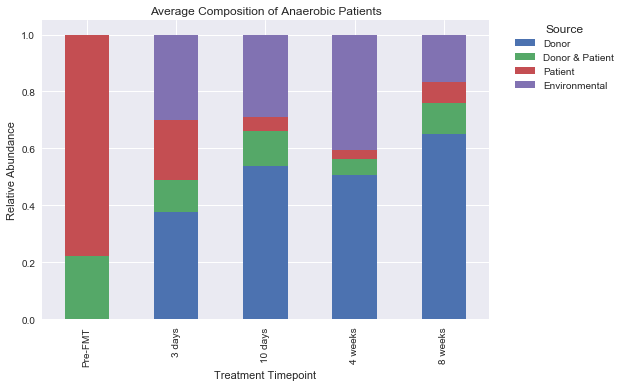

In [382]:
ax = seq_var_composition_pma_grouped_anaerobic.plot(kind="bar", stacked=True)
plt.ylabel("Relative Abundance")
plt.xlabel("Treatment Timepoint")
ax.legend(title = "Source", labels = ['Donor', 'Donor & Patient', 'Patient', 'Environmental'], bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title("Average Composition of Anaerobic Patients")
plt.show()

In [ ]:
seq_var_composition_pma_grouped_aerobic.plot(kind="bar", stacked=True)
plt.show()

In [ ]:
ax = sns.boxplot(x="timepoint", y="donor_abundance", hue="aerobic", data=seq_var_composition_direct)
plt.legend(title="")
plt.show()

In [ ]:
donor1=[] #500 - An:143, A:146
donor2=[] #485 - An:141, 159, A:176
donor3=[] #131 - An: 140, 167, A: 154, 160, 163, 178

engraftment_summary_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance", "aerobic"])
with PdfPages("engraftment_timeseries.pdf") as pp:
    for patient, donor_seqs in seq_var_dict.items():
        donor_seqs.append(set(donor_seqs[0])-set(donor_seqs[1]))
        engraftment_df = pd.DataFrame(columns=["timepoint", "direct/pma", "count", "freq","abundance"])
        for i, timepoint in enumerate(["3 days", "10 days", "4 weeks", "8 weeks"]):  
            try:

                #sample_id of sample corresponding to the given patient and timepoint
                sample_id = metadata.index[(metadata["person_id"] == patient) & (metadata["timepoint"] == timepoint)][0]
                #list of indices of seq vars from direct and pma-processed donor samples that also show up in patient at different timepoints

#                 direct = list(set(donor_seqs[0]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
#                 pma = list(set(donor_seqs[1]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
#                 direct_pma = list(set(donor_seqs[2]) & set(list(seq_freq.loc[sample_id].nonzero()[0])))
                
                direct = list(set(donor_seqs[0]) & set(seq_freq.loc[sample_id]))
                pma = list(set(donor_seqs[1]) & set(seq_freq.loc[sample_id]))
                direct_pma = list(set(donor_seqs[2]) & set(seq_freq.loc[sample_id]))
 
                direct_abundance = 0
                pma_abundance = 0
                direct_pma_abundance = 0
                
                for d in direct:
                    direct_abundance += seq_freq_abundance.loc[sample_id,seq_freq_abundance.columns[d]]
                for p in pma:
                    pma_abundance += seq_freq_abundance.loc[sample_id,seq_freq.columns[p]]    
                for dp in direct_pma:
                    direct_pma_abundance += seq_freq_abundance.loc[sample_id,seq_freq.columns[dp]]  
                aerobic = metadata.loc[sample_id, "anaerobic_fmt"]
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(seq_freq.loc[sample_id]), "abundance":direct_abundance}, ignore_index=True)
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(seq_freq.loc[sample_id]), "abundance":pma_abundance}, ignore_index=True)
                engraftment_df = engraftment_df.append({"timepoint":timepoint, "direct/pma":"direct-pma", "count":len(direct_pma), "freq":len(direct_pma)/len(seq_freq.loc[sample_id]), "abundance":direct_pma_abundance}, ignore_index=True)
                engraftment_summary_df = engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"direct", "count":len(direct), "freq":len(direct)/len(seq_freq.loc[sample_id]), "abundance":direct_abundance, "aerobic":aerobic}, ignore_index=True)
                engraftment_summary_df = engraftment_summary_df.append({"timepoint":timepoint, "direct/pma":"pma", "count":len(pma), "freq":len(pma)/len(seq_freq.loc[sample_id]), "abundance":pma_abundance,"aerobic":aerobic}, ignore_index=True)
                

            #missing timepoints
            except Exception as e:
                print(e)
        if metadata.loc[sample_id, "donor_fmt_num"] == 500:
            donor1.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        elif metadata.loc[sample_id, "donor_fmt_num"] == 485:
            donor2.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        else:
            donor3.append([engraftment_df, int(patient), metadata.loc[sample_id,"anaerobic_fmt"]])
        ax1 = sns.barplot(x="timepoint", y="count", hue="direct/pma",data = engraftment_df)
        ax1.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax1.set_ylabel("total # donor seq vars in patient")
        pp.savefig()
        plt.close()
        
        ax2 = sns.barplot(x="timepoint", y="abundance", hue="direct/pma",data = engraftment_df)
        ax2.set_title("Patient: {} Donor: {} {}".format(int(patient), int(metadata.loc[sample_id,"donor_fmt_num"]), metadata.loc[sample_id,"anaerobic_fmt"]))
        ax2.set_ylabel("total relative abundance of donor seq vars in patient")
        pp.savefig()
        plt.close()




In [391]:
genus_composition = composition_by_source(genus, genus_abundance, metadata, "genus_composition_timeseries.pdf")

index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0
index 0 is out of bounds for axis 0 with size 0


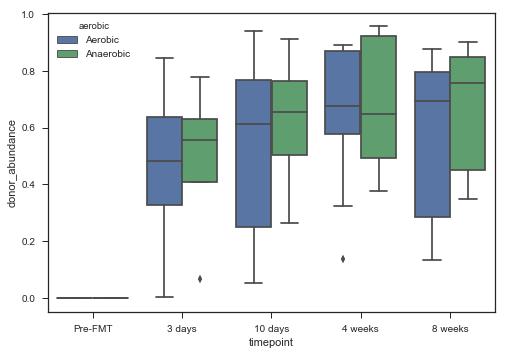

In [394]:
sns.boxplot(x="timepoint", y="donor_abundance", hue="aerobic", data=genus_composition)
plt.show()

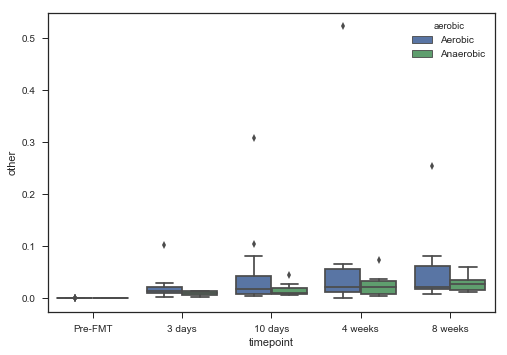

In [393]:
sns.boxplot(x="timepoint", y="other", hue="aerobic", data=genus_composition)
plt.show()